In [1]:
# Importing all libraries.
from pylab import *
from netCDF4 import Dataset
%matplotlib inline
import os
import cmocean as cm
from trackeddy.tracking import *
from trackeddy.datastruct import *
from trackeddy.geometryfunc import *
from trackeddy.init import *
from trackeddy.physics import *
from trackeddy.plotfunc import *

import matplotlib.pyplot as plt, mpld3

#import cosima_cookbook as cc

In [2]:
# Output data path
outputpath='/g/data3/hh5/tmp/akm157/mom01v5_kds75/output306/'
# Import SSH values to python environment.
ncfile=Dataset(outputpath+'rregionsouthern_ocean_daily_eta_t.nc')
eta=ncfile.variables['eta_t'][:]*100
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['xt_ocean_sub01'][:]
lat=ncfile.variables['yt_ocean_sub01'][:]

In [3]:
# Import SSH 10 yrs mean values to python environment.
ncfile=Dataset('/home/156/jm5970/github/trackeddy/data.input/meanssh_10yrs_AEXP.nc')
ssh_mean=squeeze(ncfile.variables['SSH_mean'][:])
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['Longitude'][:]
lat=ncfile.variables['Latitude'][:]

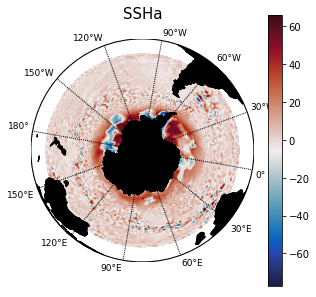

In [4]:
basemap_mplot(lon,lat,eta[0,:,:]-ssh_mean,title="SSHa",scale='Lin',cmap=cm.cm.balance\
              ,vmin='',vmax='',xan=1,yan=1,figsize=(5,5),fontsize=15)
colorbar()

In [5]:
###This mask is necessary to remask each time step, 
#It's not necesary if your mask is good in all the time steps
mask=ma.getmask(eta[0,:,:])

#Area in indexes, probably in the future it will be added an option for lon - lat coords.
#areamap=array([[3120,3180],[790,840]])
areamap=array([[3050,3150],[765,865]])

(array([], dtype=float64), <a list of 0 Text yticklabel objects>)

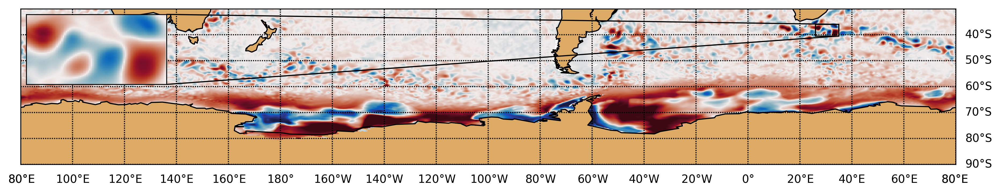

In [6]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import numpy as np

fig = plt.figure(figsize=[15,5],dpi=300)
ax = fig.add_subplot(111)

map = Basemap(projection='cyl', 
              lat_0=0, lon_0=-100)

map.fillcontinents(color='#ddaa66', lake_color='#7777ff', zorder=0)
map.drawcoastlines()

x, y = map(lon, lat)

map.pcolormesh(x, y,eta[0,:,:]-ssh_mean,cmap=cm.cm.balance,vmin=-50,vmax=50)
ax.set_ylim(-90, -30)

parallels = np.arange(-90.,-30.,10.)
# labels = [left,right,top,bottom]
map.drawparallels(parallels,labels=[False,True,True,False])
meridians = np.arange(0.,360.,20.)
map.drawmeridians(meridians,labels=[True,False,False,True])

axins = zoomed_inset_axes(ax, 6, loc=2)

axins.set_xlim(0, 40)
axins.set_ylim(-45, -30)

map2 = Basemap(llcrnrlon=26,llcrnrlat=-40.5,urcrnrlon=35,urcrnrlat=-36, ax=axins)
map2.fillcontinents()
map2.drawcoastlines()
map2.drawcountries()
map2.pcolormesh(x[areamap[0,0]:areamap[0,1]],y[areamap[1,0]:areamap[1,1]],\
                eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-80,vmax=80)

mark_inset(ax, axins, loc1=1, loc2=4, fc="none", ec="0")

plt.xticks(visible=False)
plt.yticks(visible=False)


In [7]:
eddytd1=analyseddyzt(eta,lon,lat,0,1,1,10,10,10,data_meant=ssh_mean,areamap=areamap,mask='',\
                     eccenfit=1,ellipsrsquarefit=0,gaussrsquarefit=0,\
                     destdir='',physics='',diagnostics=False,pprint=False)

1.395446030045225
1.0325475118788479
-1.010398453834592
1.584475535752439
 0% [>]100% Time Elapsed: 0 s  

In [8]:
eddytd2=analyseddyzt(eta,lon,lat,0,1,1,20,20,10,data_meant=ssh_mean,areamap=areamap,mask='',\
                     eccenfit=1,ellipsrsquarefit=0,gaussrsquarefit=0,\
                     destdir='',physics='',diagnostics=False,pprint=False)

0.9554737846479155
5.128028264073852
1.1702618152744304
1.3531140749026227
 0% [>]100% Time Elapsed: 0 s  

In [9]:
eddytd3=analyseddyzt(eta,lon,lat,0,1,1,30,30,10,data_meant=ssh_mean,areamap=areamap,mask=''\
                     ,destdir='',physics='',diagnostics=False,pprint=False)

0.9202587946687346
0.9833110859742058
1.0783428319040067
 0% [>]100% Time Elapsed: 0 s  

In [10]:
eddytd4=analyseddyzt(eta,lon,lat,0,1,1,40,40,10,data_meant=ssh_mean,areamap=areamap,mask=''\
                     ,destdir='',physics='',diagnostics=False,pprint=False)

0.917534512545965
1.0195654122731999
 0% [>]100% Time Elapsed: 0 s  

In [11]:
eddytd5=analyseddyzt(eta,lon,lat,0,1,1,50,50,10,data_meant=ssh_mean,areamap=areamap,mask=''\
                     ,destdir='',physics='',diagnostics=False,pprint=False)

0.9289848970931299
0.9743579553812067
 0% [>]100% Time Elapsed: 0 s  

(25.5, 35)

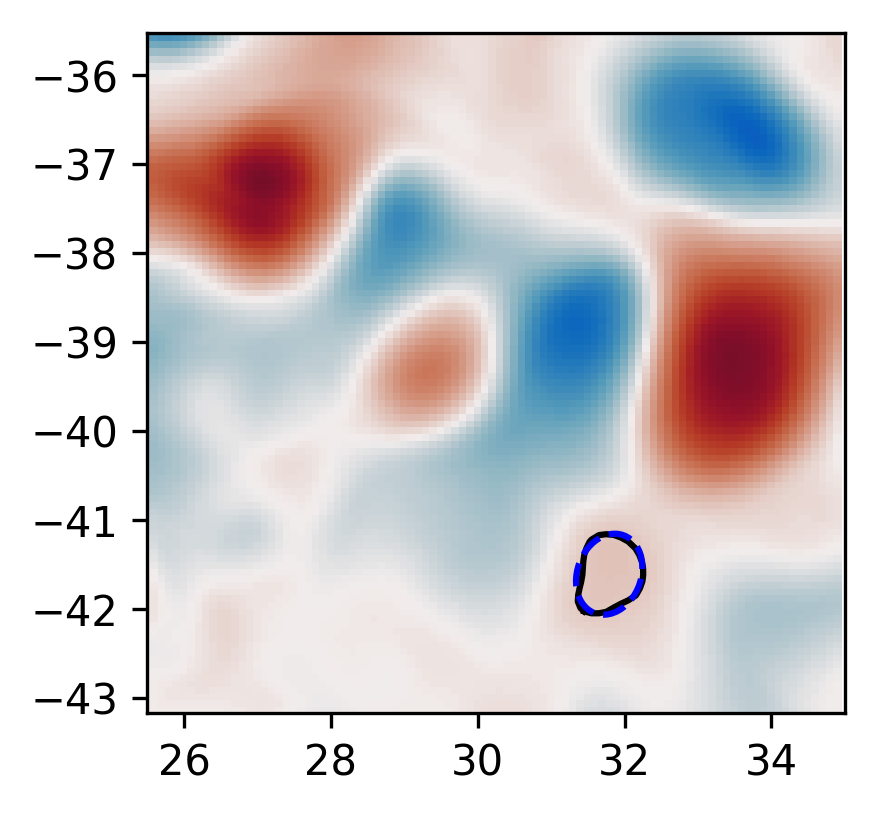

In [12]:
plt.figure(figsize=[3,3],dpi=300)
plot(eddytd1['eddyn_0']['contour'][0][0],eddytd1['eddyn_0']['contour'][0][1],'-k')
plot(eddytd1['eddyn_0']['ellipse'][0][0],eddytd1['eddyn_0']['ellipse'][0][1],'--b')
pcolormesh(x[areamap[0,0]:areamap[0,1]],y[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
           -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-80,vmax=80)
xlim([25.5,35])

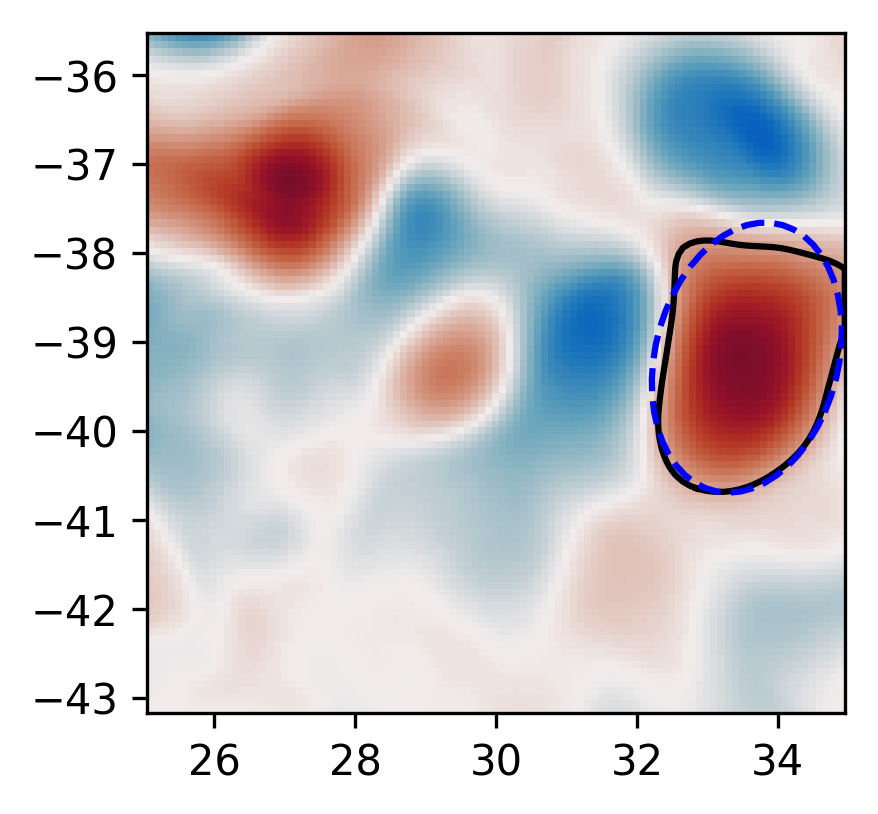

In [13]:
plt.figure(figsize=[3,3],dpi=300)
plot(eddytd2['eddyn_0']['contour'][0][0],eddytd2['eddyn_0']['contour'][0][1],'-k')
plot(eddytd2['eddyn_0']['ellipse'][0][0],eddytd2['eddyn_0']['ellipse'][0][1],'--b')
pcolormesh(x[areamap[0,0]:areamap[0,1]],y[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
           -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-80,vmax=80)
#ylim([-40.5,-34.5])

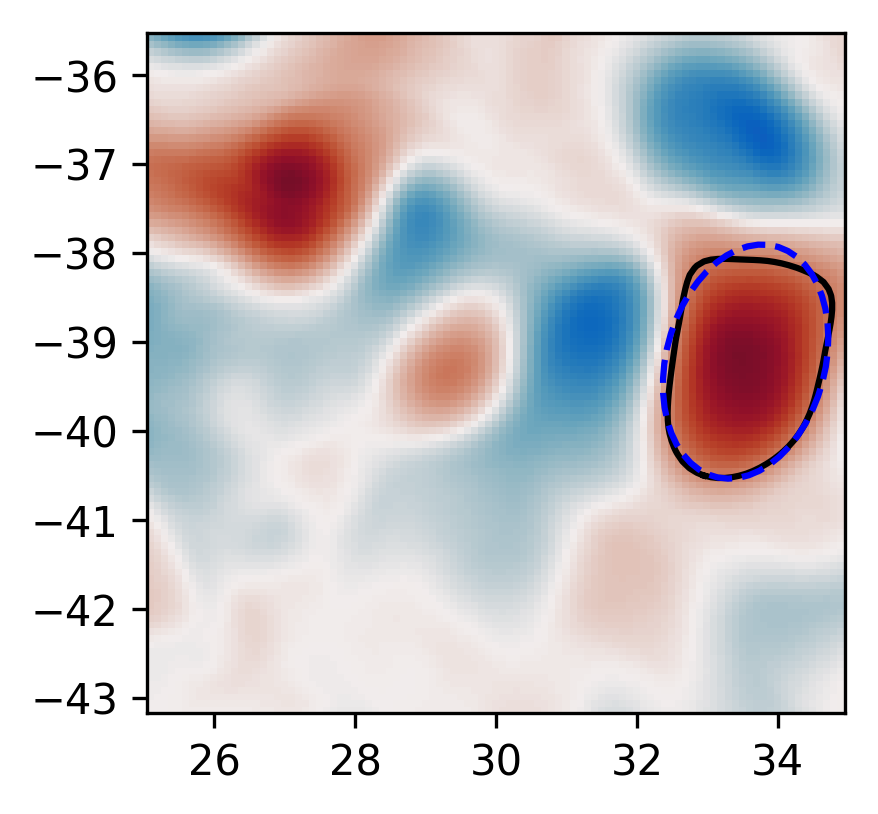

In [14]:
plt.figure(figsize=[3,3],dpi=300)
plot(eddytd3['eddyn_0']['contour'][0][0],eddytd3['eddyn_0']['contour'][0][1],'-k')
plot(eddytd3['eddyn_0']['ellipse'][0][0],eddytd3['eddyn_0']['ellipse'][0][1],'--b')
pcolormesh(x[areamap[0,0]:areamap[0,1]],y[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
           -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-80,vmax=80)

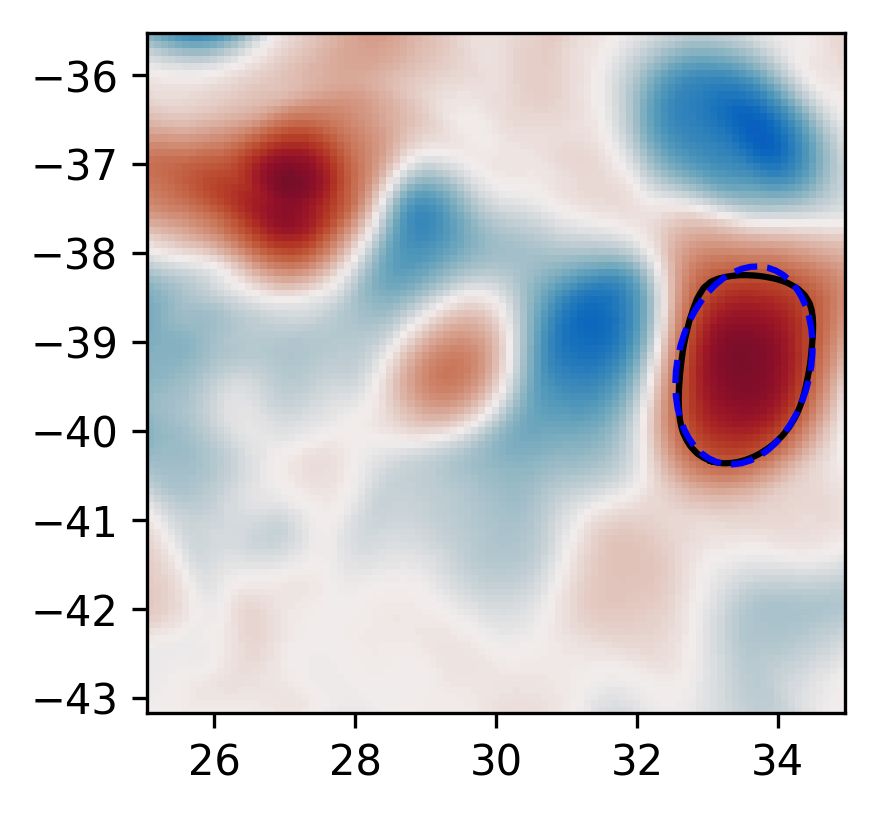

In [15]:
plt.figure(figsize=[3,3],dpi=300)
plot(eddytd4['eddyn_0']['contour'][0][0],eddytd4['eddyn_0']['contour'][0][1],'-k')
plot(eddytd4['eddyn_0']['ellipse'][0][0],eddytd4['eddyn_0']['ellipse'][0][1],'--b')
pcolormesh(x[areamap[0,0]:areamap[0,1]],y[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
           -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-80,vmax=80)

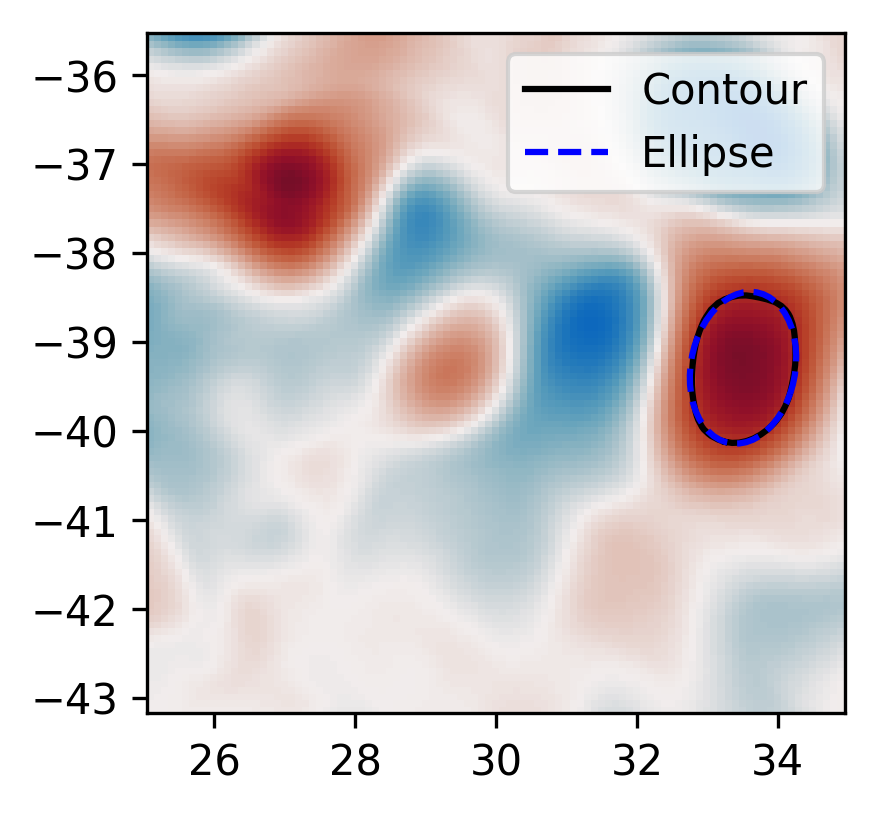

In [16]:
plt.figure(figsize=[3,3],dpi=300)
plot(eddytd5['eddyn_0']['contour'][0][0],eddytd5['eddyn_0']['contour'][0][1],'-k',label='Contour')
plot(eddytd5['eddyn_0']['ellipse'][0][0],eddytd5['eddyn_0']['ellipse'][0][1],'--b',label='Ellipse')
pcolormesh(x[areamap[0,0]:areamap[0,1]],y[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
           -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-80,vmax=80)
legend()

In [17]:
%matplotlib inline
eddytd3=analyseddyzt(eta,lon,lat,0,60,1,40,20,1,data_meant=ssh_mean,areamap=areamap,mask=''\
                     ,destdir='',physics='',diagnostics=False,pprint=False)

0.917534512545965
1.0195654122731999
0.9149204937905309
1.0245550113869892
0.9149093434119281
1.0292610376563338
0.9114216600929528
1.0349618021862073
0.9127988205062373
1.0392697294313213
0.9128058839418179
1.0621301440411839
0.9218611217469136
0.918663288648656
0.9224101385948721
0.9223876129831703
0.9426623557554519
1.0783225945266142
0.9202587946687346
0.9833110859742058
1.0783428319040067
0.925094224694437
0.9833331332412212
0.9251008952542774
1.076126365698017
1.110139465492871
0.9426821383900843
1.116415624826199
1.1101119243603004
0.9426807801398089
1.1675413004954078
0.9520054482931258
1.505338573332289
0.9520075080834188
1.5052925726403554
1.1207213327547363
0.9520020834838873
1.686001924972577
0.9520121997499712
1.8383322937697448
0.9576418427439977
3.2877481107799595
0.9554737846479155
5.128028264073852
 0% [>]2% Time Elapsed: 3 s  0.9174254861716955
1.019406041057979
0.9169973321407847
0.9147231620277227
1.0259377295877288
0.9105477206439654
1.0295996616293637
0.9105552743

 0% [==========>]18% Time Elapsed: 30 s  0.9455440881316146
0.9455291942396278
0.9430803305632427
0.950119177017233
0.9506591715991723
0.9507478861754309
0.948907610248193
0.9489200387117926
0.9604858786888807
0.9596750891211939
0.9622318138741173
0.9612151095715586
0.9108291310101949
0.9088518359648634
0.9611619825618644
0.9264068381608991
0.9779657150763024
0.945205754146487
0.9788776320275426
0.9452069761471382
1.0673307546462183
0.9996093230992775
1.0673203593223062
1.0157110515281211
1.067370265305506
1.0339607452775306
1.418643851196966
1.4186543951996449
 0% [===========>]20% Time Elapsed: 33 s  0.9481575397057406
0.9481600195683433
0.9461381777422343
1.0796759852501203
0.9461399831052607
1.1571214732587738
0.946159776710503
0.9457263651862298
0.9570169857492947
0.957029103366411
0.9566014526842752
0.9584952875099547
0.9583017452351837
0.9583001070493489
0.906615894396024
0.9748406270398324
0.9054102667631858
0.9756804964901817
0.9193424145506016
0.977366953370803
0.947470485864

0.9741827875878103
0.9382783468935024
0.9790424867452663
0.9498441100297536
0.9932277882072894
1.0422024196002417
0.9931980342479857
1.042066676394281
0.9974731694704786
1.0957628659926886
1.0030951277627913
1.3309000636768673
 0% [=====================>]37% Time Elapsed: 59 s  0.9532550518054251
0.9532591083229738
1.0259841710846078
0.9535154171004062
1.0333215712122987
0.9649963262899954
1.0267100560559297
0.965033328622217
1.0181573077196011
0.9668928649492486
0.9677636615703824
0.9677694997584348
0.9685348308538451
0.9685150392257376
0.9725933248389894
0.976578786965612
0.9765399694421857
0.9765531342240528
0.9882885314050809
0.9882815036224929
0.9346818615637418
0.9909323059710363
0.9322312111463769
0.995267832257632
0.987630363792267
1.010760095021165
1.0000444935602446
1.0107525588792245
1.0238735439406457
1.0178111558470488
1.2229405859817222
 0% [======================>]38% Time Elapsed: 61 s  0.9585450424428871
0.9585283501385258
1.029189958813016
0.9585069617603216
1.0321980

1.1389031167306165
1.0139704908830482
1.1491382884116539
1.1134663206762923
1.163277610045964
1.1134878359602607
1.2079365745683712
1.446622260266463
 0% [==================================>]58% Time Elapsed: 90 s  0.943661668936324
0.9536926529265046
0.9619841665144854
0.9619709982357186
1.0002408045403388
0.9762809535117537
1.0050969273189867
0.978247907395091
1.011470517236346
0.9858876707091828
1.0156011855335478
1.002494134390991
1.013542728775082
1.0139115487695132
1.0199262602515662
1.0138802297831706
1.01734442650733
1.0367340199380628
1.0194072062487565
1.0483125073081756
1.0145659399802107
1.073452514524916
1.017605638412567
1.0828871293860296
0.914680540129386
1.0947816975926434
0.9229921917645764
1.0947888247994058
0.9307318663113301
1.1307543840298286
0.9804454961758873
1.141569926477361
1.033057519961201
1.179663904012379
1.0690398809763697
1.1912812230768048
1.2280784354162557
1.2015781302897695
1.3122005124479275
 0% [===================================>]60% Time Elapse

0.9480165133528338
0.9301353559432938
0.9624800739762691
0.9516349989417998
0.9649265101127696
0.9746039366342073
0.982115577713068
1.0540856678178745
0.9805539145052273
1.1347445434656858
0.9805419700520537
1.1924753035161941
1.00500871550956
1.370343287172955
1.0049832452245773
1.4967088755659417
 0% [============================================>]75% Time Elapsed: 117 s  0.925965302294095
0.9249499981535029
0.9249735689036543
0.9998958774312214
0.9235804103176729
1.0059196233369367
0.9284099000900888
1.0056837242885253
0.9299922441508753
1.0113992701697496
0.9284671426101462
1.0139626422285042
0.9285185211473342
1.0173634171037629
0.926949932963558
1.0190299240271237
0.9297225510642881
0.9453198004301246
0.9437471348685483
0.9295359748840843
0.9437265103016648
0.9235903953317076
0.9421002903854145
0.9245613747211214
0.9463972865701032
0.9525770982272947
0.9446924614380747
0.9786242880621034
0.9761111136915381
1.0743963137477144
0.9743738738120253
1.0744263897484123
0.9743939333149179

eddyn_0


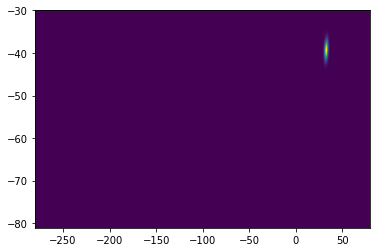

eddyn_1


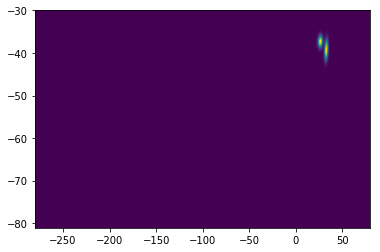

eddyn_3


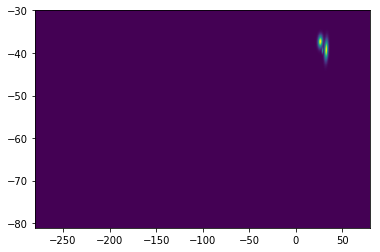

eddyn_4


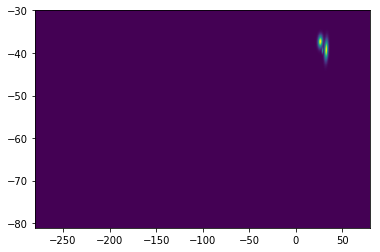

eddyn_5


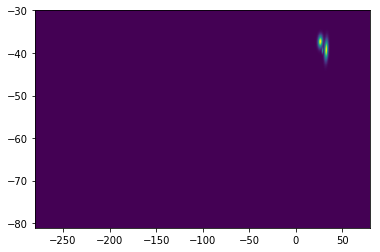

eddyn_6


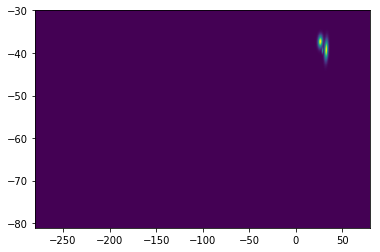

eddyn_7


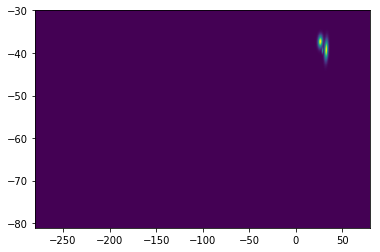

In [18]:
fieldSp=reconstruct_syntetic(shape(eta),lon,lat,eddytd3,diagnostics=True)

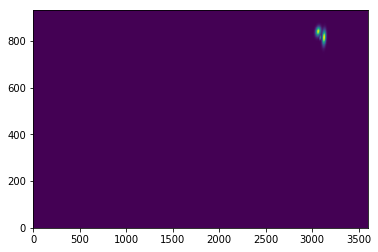

In [19]:
pcolormesh(fieldSp[1,:,:])

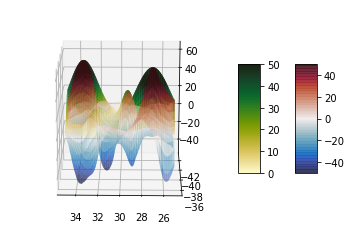

In [20]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import cmocean as cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure()
ax = fig.gca(projection='3d')

Lon,Lat=meshgrid(lon, lat)
surf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       cmap=cm.cm.balance,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
fig.colorbar(surf, shrink=0.5, aspect=5)

ssurf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       cmap=cm.cm.speed,vmin=0,vmax=50,\
                       alpha=1,shade='gouraud',antialiased=True)
ax.view_init(18, 91)
fig.colorbar(ssurf, shrink=0.5, aspect=5)

In [21]:
test=twoD_Gaussian((Lon,Lat), *eddytd2['eddyn_0']['2dgaussianfit'][0]).reshape(len(lat),len(lon))

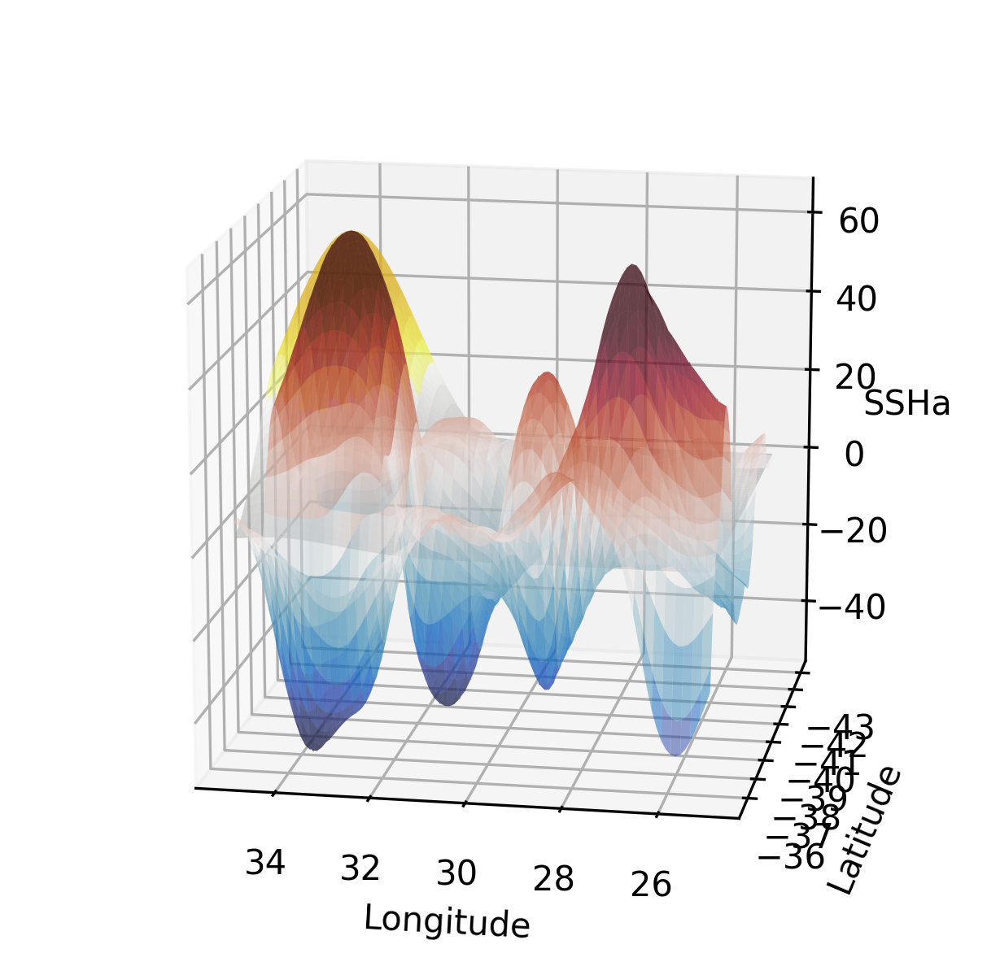

In [22]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import cmocean as cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure(figsize=(5,5),dpi=300)
ax = fig.gca(projection='3d')

Lon,Lat=meshgrid(lon, lat)
surf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
#fig.colorbar(surf, shrink=0.8, aspect=10)

ssurf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       test[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       cmap=cm.cm.oxy,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('SSHa')
ax.view_init(15, 100)
#fig.colorbar(ssurf, shrink=0.8, aspect=10)

Text(0,0.5,'Latitude')

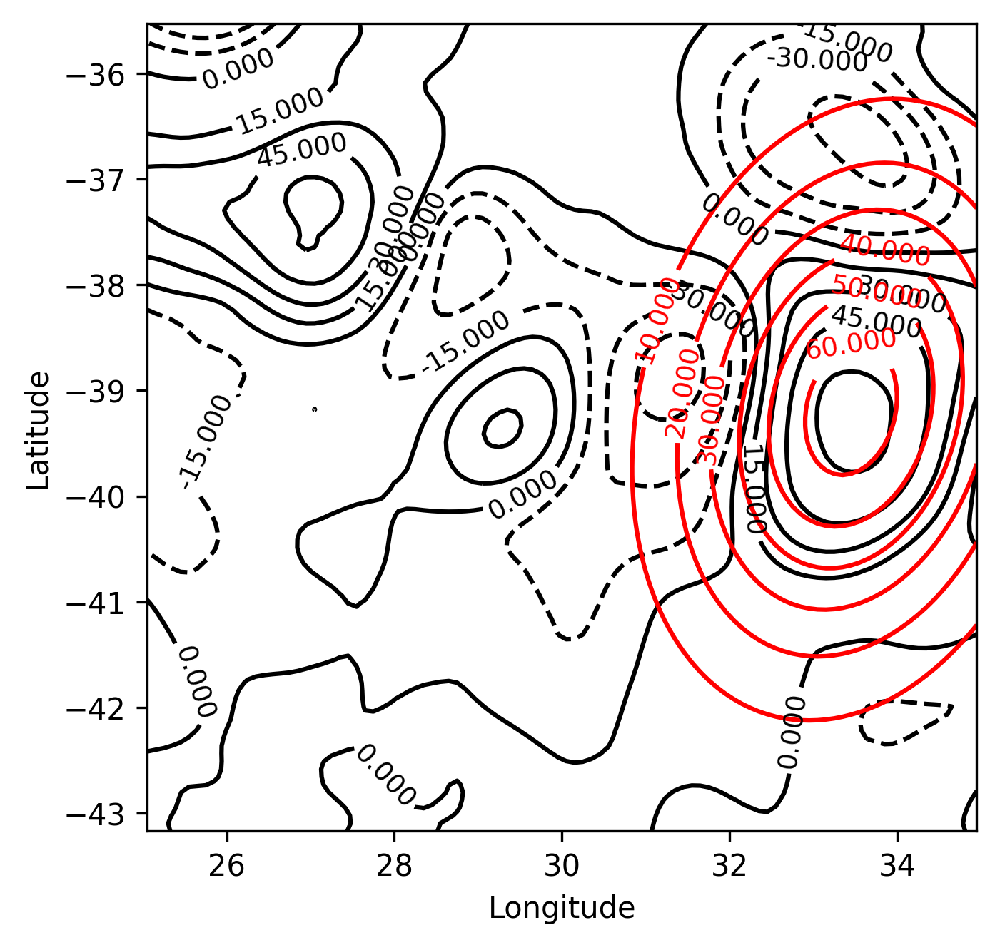

In [23]:
fig = plt.figure(figsize=(5,5),dpi=300)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],vmin=-50,vmax=50,colors='k')
clabel(CS, fontsize=9, inline=1)
#fig.colorbar(surf, shrink=0.8, aspect=10)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       test[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],vmin=-50,vmax=50,colors='r')
clabel(CS, fontsize=9, inline=1)

xlabel('Longitude')
ylabel('Latitude')

#ax.view_init(15, 100)
#fig.colorbar(ssurf, shrink=0.8, aspect=10)

In [ ]:
eddytd3['eddyn_0']['2dgaussianfit'][0]

array([ 65.20619202,  33.45000076, -39.18201828,   1.26460989,
         1.58913892,   0.50822254,   0.        ,   0.        ,
         0.        ])

In [ ]:
%matplotlib inline
eddytdn=analyseddyzt(eta,lon,lat,0,60,1,-40,-20,-1,data_meant=ssh_mean,areamap=areamap,mask=''\
                     ,destdir='',physics='',diagnostics=False,pprint=False)


0.9527561483477697
0.957404694683649
0.9960087876619149
0.9490735131596528
1.0189743369221682
0.9536206642192139
1.0064125321920419
0.9934539412027077
1.0504975587562364
0.9981372768765867
1.050553111725007
0.9981394561746761
1.0352440210819058
0.9946994259844417
1.1159747803427145
0.9946604635474949
1.1079212513713392
0.9610204977170913
0.9986062637334664
1.1060029695839235
0.958276399454026
1.06391719738515
1.1897455875190497
0.9596162066605399
1.0676737603469166
1.1733369465250065
0.9595936463123098
1.0626858071217
1.384592307731274
0.9697309022641565
1.0596022885639773
1.384576333556625
0.9800151859642179
1.0581329035703375
1.3490484175241837
0.9789543255202977
1.0579579112093145
1.5801516979618324
0.9817355987442946
1.0578055975000558
1.580115114823366
0.9817376843695536
1.0512043372789148
1.7049910987856816
0.981739279656396
1.1417967014997308
1.184642282843085
2.0847440714315137
1.0104178150167251
1.1367622721088921
1.1815770612931802
2.037686102963593
1.0108848356051567
1.13682

1.0610198586811705
0.9179966542544447
1.063400520196672
0.91797389777539
0.9177559311372138
0.9231731226681928
0.9348913783642657
0.9231796069713296
0.9393449876000253
0.9290644117387038
0.925905010577336
0.9287042639515338
1.0227452575123632
0.9388643401682174
1.1842189661515476
0.9389146510596913
1.2372617200164975
0.9526223830360082
1.2216413261813555
0.9516021708718714
1.2232685434635389
0.9512489277912556
1.223972636234154
0.9668237541137431
 0% [=======>]13% Time Elapsed: 27 s  0.9427936923223752
0.9328105364482101
0.9330839106888342
1.000711548231078
0.9268331287309128
1.012385619689286
0.9246481336002635
0.9675158316384989
1.0170562131123113
0.9197468412632807
0.9576258974812314
1.0351757963805088
0.9197429388970967
0.9178145749351745
0.9176202915686531
0.9176150283393103
0.9176214054332379
0.9163666748103442
0.923536324372389
0.9235633845677239
0.9235617973228262
0.9237623059978821
0.9406640948925138
0.9406436451379906
0.940674561668986
1.3337297024748547
0.9408933312300232
1.

1.1628322636537092
0.9917168221071435
1.162839070759927
1.0048898428202913
1.2371005658085172
1.0049057191348407
1.2370820341034723
1.0069244896944445
1.2430021246437677
1.0151973998772268
1.2524004710375307
1.015211738288518
1.298985851886802
1.0316373196245179
1.2993747766540387
1.0489264866293884
1.1962653075303065
1.0489335827970716
1.1976299375856896
1.0489242481855017
1.0705727179938578
1.0705606142908017
 0% [==================>]32% Time Elapsed: 54 s  0.9851080473111075
1.0363524471920456
0.9737572961809989
1.0544270701371912
0.9738278952766584
1.0561441265382656
0.9773994711927536
1.088314425975999
0.9743908202484473
1.0883354800740763
0.9836505738480062
1.1096079443142055
0.9834363012003179
1.1503617105808281
0.9834226840767907
1.1503917437048958
0.9895933279978548
1.1596863925199687
0.9895920432504318
1.202707211089429
1.00244578887954
1.2148565241301732
1.0143704016525685
1.2148060620530747
1.013778547050322
1.2452657704292212
1.0137545016440828
1.2452548047481726
1.0301669

In [ ]:
eddytdn['eddyn_0']['2dgaussianfit'][0]

In [ ]:
test=twoD_Gaussian((Lon,Lat), *eddytdn['eddyn_0']['2dgaussianfit'][0]).reshape(len(lat),len(lon))

In [ ]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import cmocean as cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure(figsize=(5,5),dpi=300)
ax = fig.gca(projection='3d')

Lon,Lat=meshgrid(lon, lat)
surf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],cmap=cm.cm.balance,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
#fig.colorbar(surf, shrink=0.8, aspect=10)
ssurf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       test[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       cmap=cm.cm.oxy,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('SSHa')
ax.view_init(15, 100)
#fig.colorbar(ssurf, shrink=0.8, aspect=10)

In [ ]:
fig = plt.figure(figsize=(5,5),dpi=300)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],vmin=-50,vmax=50,colors='k')
clabel(CS, fontsize=9, inline=1)
#fig.colorbar(surf, shrink=0.8, aspect=10)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       test[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],vmin=-50,vmax=50,colors='r',levels=range(-50,0,10))
clabel(CS, fontsize=9, inline=1)

xlabel('Longitude')
ylabel('Latitude')

#ax.view_init(15, 100)
#fig.colorbar(ssurf, shrink=0.8, aspect=10)

# Plot time-steps of the original Field and Syntetic

In [ ]:
fieldSn=reconstruct_syntetic(shape(eta),lon,lat,eddytdn,diagnostics=True)

In [ ]:
fig = plt.figure(figsize=(7,5),dpi=300)
ax = fig.gca(projection='3d')

Lon,Lat=meshgrid(lon, lat)
surf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       cmap=cm.cm.balance,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
fig.colorbar(surf, shrink=0.8, aspect=15)

ssurf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                        +fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        cmap=cm.cm.oxy,vmin=-50,vmax=50,\
                        alpha=0.5,shade='gouraud',antialiased=True)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('SSHa')
fig.colorbar(ssurf, shrink=0.8, aspect=15)
ax.view_init(-90, 100)

In [ ]:
fig = plt.figure(figsize=(5,5),dpi=300)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],vmin=-50,vmax=50,colors='k')
clabel(CS, fontsize=9, inline=1)
#fig.colorbar(surf, shrink=0.8, aspect=10)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]+\
                       fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       vmin=-50,vmax=50,colors='r')
clabel(CS, fontsize=9, inline=1)

xlabel('Longitude')
ylabel('Latitude')

#ax.view_init(15, 100)
#fig.colorbar(ssurf, shrink=0.8, aspect=10)

In [ ]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import cmocean as cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure(figsize=(6,5),dpi=300)
ax = fig.gca(projection='3d')

Lon,Lat=meshgrid(lon, lat)
surf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]-\
                       (fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                        +fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]),\
                       cmap=cm.cm.delta,vmin=-20,vmax=20,\
                       alpha=0.5,shade='gouraud',antialiased=True)
fig.colorbar(surf, shrink=0.8, aspect=15)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('SSHa - Syntetic Field')
ax.view_init(0, 90)

In [ ]:
fig = plt.figure(figsize=(5,5),dpi=300)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]-\
                       (fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                        +fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]])\
                       ,vmin=-50,vmax=50,colors='b')
clabel(CS, fontsize=9, inline=1)

xlabel('Longitude')
ylabel('Latitude')

#ax.view_init(15, 100)
#fig.colorbar(ssurf, shrink=0.8, aspect=10)

In [ ]:
eddytdn1=analyseddyzt(eta,lon,lat,0,1,1,-18,-18,-10,data_meant=ssh_mean,areamap=areamap,mask='',\
                     eccenfit=1,ellipsrsquarefit=-1,gaussrsquarefit=-1,\
                     destdir='',physics='',diagnostics=False,pprint=False)

In [ ]:
ssha=eta-ssh_mean

In [ ]:
figure(figsize=(6,5),dpi=300)
threshold=7
color=['r','b','g','m','c']
xtext=[0.6,10.6,20.6,30.6,40.6]
#xtext=[5.6,15.6,25.6,35.6]
ytext=-3
iii=0

for ii in eddytdn1.keys(): 
    
    xidmin,xidmax=find2l(lon,lon,eddytdn1[ii]['contour'][0][0].min(),\
                         eddytdn1[ii]['contour'][0][0].max())
    yidmin,yidmax=find2l(lat,lat,eddytdn1[ii]['contour'][0][1].min(),\
                         eddytdn1[ii]['contour'][0][1].max())
    
    ssh_in_contour=ssha[0,yidmin-threshold+1:yidmax+threshold,xidmin-threshold+1:xidmax+threshold]
    lon_contour=lon[xidmin-threshold+1:xidmax+threshold]
    lat_contour=lat[yidmin-threshold+1:yidmax+threshold]
    
    
    profile,fit,checkm=extractprofeddy(eddytdn1[ii]['majoraxis'],\
                            ssh_in_contour,\
                            lon_contour,\
                            lat_contour,\
                            50,gaus='One',kind='linear',\
                            gaussrsquarefit=0.65,\
                            diagnostics=False,plotprofile=True)
    Rsquared = rsquard(profile,fit)
    plt.plot(range(0,50),profile,color[iii]+'-')
    plt.plot(range(0,50),fit,color[iii]+'--')
    if Rsquared < 0.61:
        plt.text(xtext[iii],ytext,r'$R^2$='+"%0.2f" %Rsquared,color=color[iii],\
             bbox=dict(facecolor='red', alpha=0.1))
    else:
        plt.text(xtext[iii],ytext,r'$R^2$='+"%0.2f" %Rsquared,color=color[iii],\
             bbox=dict(facecolor='green', alpha=0.1))
    

    iii=iii+1
    #plot(eddytdn1[ii]['contour'][0][0],eddytdn1[ii]['contour'][0][1])
    #show()
ylabel('SSHa (cm)')
xlabel('Position (n)')
plot(0,0,'--k',label='Fitted')
plot(0,0,'-k',label='Profile')
xlim(0,49)
legend(loc=3)

In [ ]:
figure(figsize=(6,5),dpi=300)
threshold=7
color=['r','b','g','m','c']
xtext=[5.6,15.6,25.6,35.6]
xtext=[0.6,10.6,20.6,30.6,40.6]
ytext=-3
iii=0

for ii in eddytdn1.keys(): 
    
    xidmin,xidmax=find2l(lon,lon,eddytdn1[ii]['contour'][0][0].min(),\
                         eddytdn1[ii]['contour'][0][0].max())
    yidmin,yidmax=find2l(lat,lat,eddytdn1[ii]['contour'][0][1].min(),\
                         eddytdn1[ii]['contour'][0][1].max())
    
    ssh_in_contour=ssha[0,yidmin-threshold+1:yidmax+threshold,xidmin-threshold+1:xidmax+threshold]
    lon_contour=lon[xidmin-threshold+1:xidmax+threshold]
    lat_contour=lat[yidmin-threshold+1:yidmax+threshold]
    
    
    profile,fit,checkm=extractprofeddy(eddytdn1[ii]['minoraxis'],\
                            ssh_in_contour,\
                            lon_contour,\
                            lat_contour,\
                            50,gaus='One',kind='linear',\
                            gaussrsquarefit=0.65,\
                            diagnostics=False,plotprofile=True)
    Rsquared = rsquard(profile,fit)
    plt.plot(range(0,50),profile,color[iii]+'-')
    plt.plot(range(0,50),fit,color[iii]+'--')
    if Rsquared < 0.6:
        plt.text(xtext[iii],ytext,r'$R^2$='+"%0.2f" %Rsquared,color=color[iii],\
             bbox=dict(facecolor='red', alpha=0.1))
    else:
        plt.text(xtext[iii],ytext,r'$R^2$='+"%0.2f" %Rsquared,color=color[iii],\
             bbox=dict(facecolor='green', alpha=0.1))
    

    iii=iii+1
    #plot(eddytdn1[ii]['contour'][0][0],eddytdn1[ii]['contour'][0][1])
    #show()
ylabel('SSHa (cm)')
xlabel('Position (n)')
plot(0,0,'--k',label='Fitted')
plot(0,0,'-k',label='Profile')
xlim(0,49)
legend(loc=3)

In [ ]:
eddytd3test=analyseddyzt(eta,lon,lat,0,1,1,40,10,1,data_meant=ssh_mean,areamap=areamap,mask=''\
                     ,destdir='',physics='',mode='parabolic',diagnostics=False,pprint=False)


In [ ]:
eddytd3testn=analyseddyzt(eta,lon,lat,0,1,1,-40,-10,-1,data_meant=ssh_mean,areamap=areamap,mask=''\
                     ,destdir='',physics='',mode='parabolic',diagnostics=False,pprint=False)

In [ ]:

def reconstruct_syntetic(varshape,lon,lat,eddytd,mode='gaussian',usefullfit=False,diagnostics=False):
    '''
    *************** reconstruct_syntetic *******************
    Recunstruct the syntetic field using the gaussian 
    parameters saved in the dictionary of eddies.
    Notes:
        
    Args:
        
    Returns:
        
    Usage:
    
    '''
    Lon,Lat=np.meshgrid(lon,lat)
    fieldfit=np.zeros(varshape)
    for key in eddytd.keys():
        counter=0
        for tt in range(0,len(eddytd[key]['time'])):
            ttt=eddytd[key]['time'][tt]
            curvefit=eddytd[key]['2dgaussianfit'][counter]
            if isinstance(curvefit, np.float64):
                curvefit=eddytd[key]['2dgaussianfit']
            #Remove the slope and constant in the reconstruction of the eddy.
            if mode == 'parabolic':
                fittedcurve=twoD_Paraboloid((Lon,Lat), *curvefit[0:6])
                level=eddytd[key]['level']
                print(level)
                if level>0:
                    fittedcurve[fittedcurve<0]=0
                else:
                    fittedcurve[fittedcurve>0]=0
            elif mode == 'best':
                print('Work in progress')            
            elif mode == 'both':
                print('Work in progress')
            else:
                if usefullfit==False:
                    curvefit[-1]=0
                    curvefit[-2]=0
                    curvefit[-3]=0
                #print(gaussfit)
                fittedcurve=twoD_Gaussian((Lon,Lat), *curvefit)
            fieldfit[ttt,:,:]=fieldfit[ttt,:,:]+fittedcurve.reshape(len(lat),len(lon))
            counter=counter+1
        if diagnostics==True:
            print(key)
            plt.pcolormesh(Lon,Lat,fieldfit[0,:,:])
            plt.show()
    return fieldfit

In [42]:
fieldS3test=reconstruct_syntetic(shape(eta),lon,lat,eddytd3test,mode='parabolic')

In [43]:
fieldS3testn=reconstruct_syntetic(shape(eta),lon,lat,eddytd3testn,mode='parabolic')

[-18.]
[-10.]
[-20.]
[-14.]


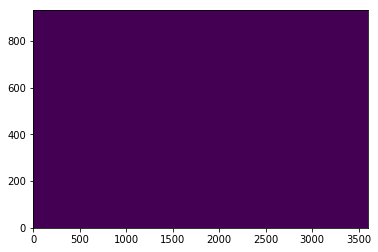

In [44]:
pcolormesh(fieldS3test[0,:,:])

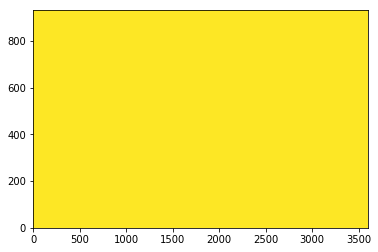

In [45]:
pcolormesh(fieldS3testn[0,:,:])

In [46]:
print(eddytd3test['eddyn_0']['2dgaussianfit'][0])
fieldS3testp=twoD_Paraboloid((Lon,Lat), *eddytd3test['eddyn_0']['2dgaussianfit'][0][:6]).reshape(len(lat),len(lon))
fieldS3testp[fieldS3testp<0]=0

[ 65.20619202  33.45000076 -39.18201828   1.41010615   1.7922038
   0.32645459]


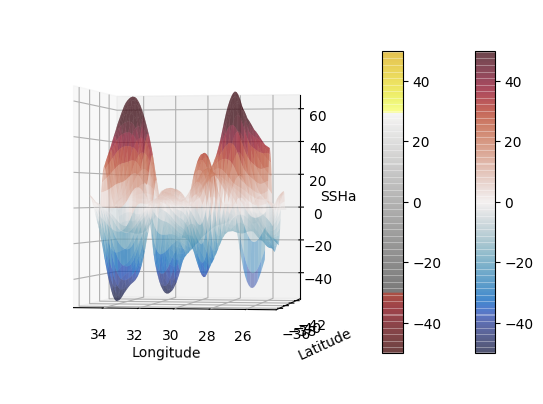

In [47]:
%matplotlib inline
fig = plt.figure(figsize=(7,5),dpi=100)
ax = fig.gca(projection='3d')

Lon,Lat=meshgrid(lon, lat)
surf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       cmap=cm.cm.balance,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
fig.colorbar(surf, shrink=0.8, aspect=15)

ssurf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        fieldS3testp[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        cmap=cm.cm.oxy,vmin=-50,vmax=50,\
                        alpha=0.5,shade='gouraud',antialiased=True)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('SSHa')
fig.colorbar(ssurf, shrink=0.8, aspect=15)
ax.view_init(0, 100)

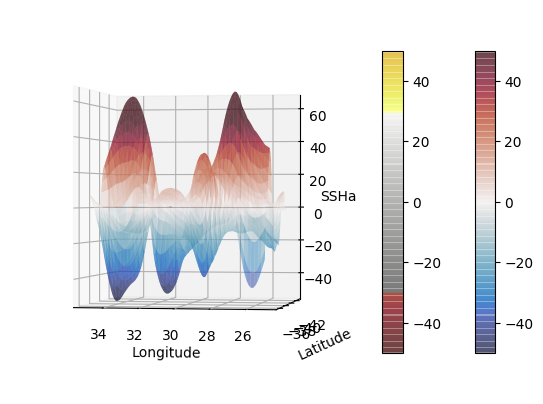

In [48]:
%matplotlib inline
fig = plt.figure(figsize=(7,5),dpi=100)
ax = fig.gca(projection='3d')

Lon,Lat=meshgrid(lon, lat)
surf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       cmap=cm.cm.balance,vmin=-50,vmax=50,\
                       alpha=0.5,shade='gouraud',antialiased=True)
fig.colorbar(surf, shrink=0.8, aspect=15)

ssurf = ax.plot_surface(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        fieldS3test[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                        cmap=cm.cm.oxy,vmin=-50,vmax=50,\
                        alpha=0.5,shade='gouraud',antialiased=True)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('SSHa')
fig.colorbar(ssurf, shrink=0.8, aspect=15)
ax.view_init(0, 100)

Text(0,0.5,'Latitude')

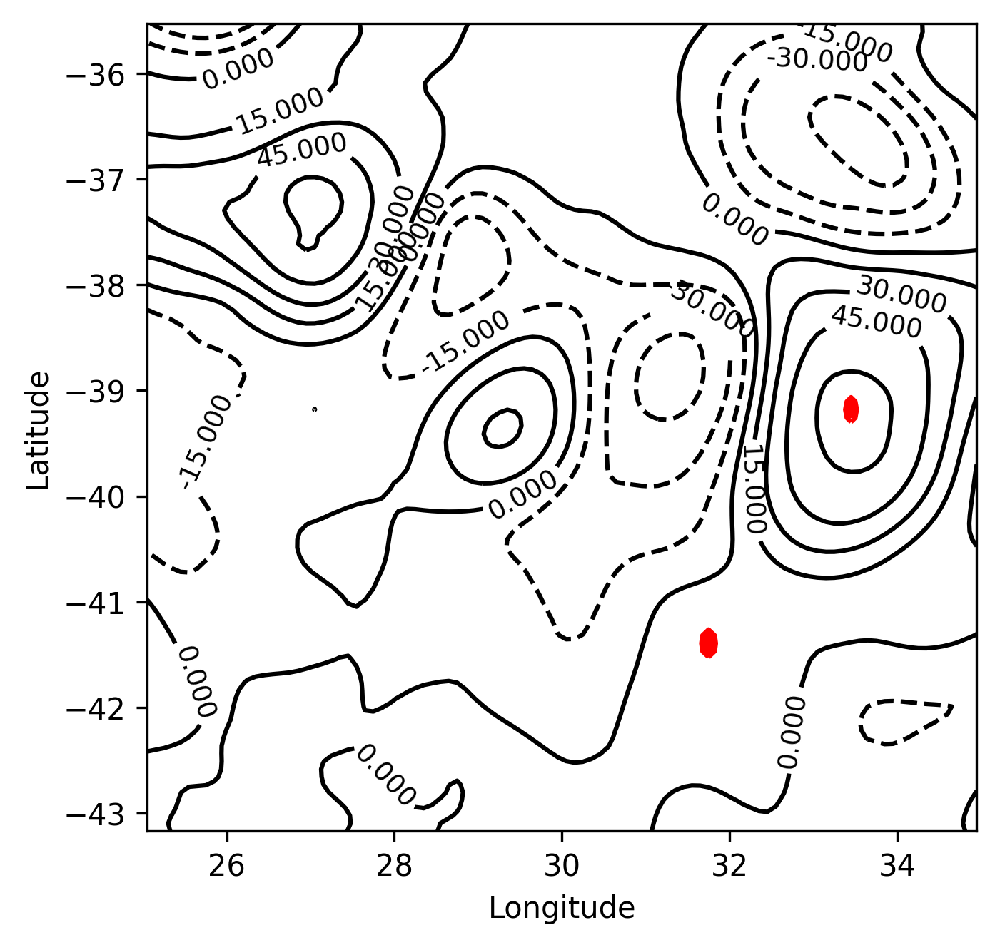

In [49]:
fig = plt.figure(figsize=(5,5),dpi=300)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       -ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],vmin=-50,vmax=50,colors='k')
clabel(CS, fontsize=9, inline=1)
#fig.colorbar(surf, shrink=0.8, aspect=10)

CS=contour(Lon[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       Lat[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]],\
                       fieldS3test[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                       ,vmin=-50,vmax=50,colors='r')
clabel(CS, fontsize=9, inline=1)

xlabel('Longitude')
ylabel('Latitude')

#ax.view_init(15, 100)
#fig.colorbar(ssurf, shrink=0.8, aspect=10)

In [50]:
u_eta,v_eta=geovelfield(eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,\
                        lon[areamap[0,0]:areamap[0,1]],\
                        lat[areamap[1,0]:areamap[1,1]],\
                        mask[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]])


In [51]:
KEn=KE(u_eta,v_eta)

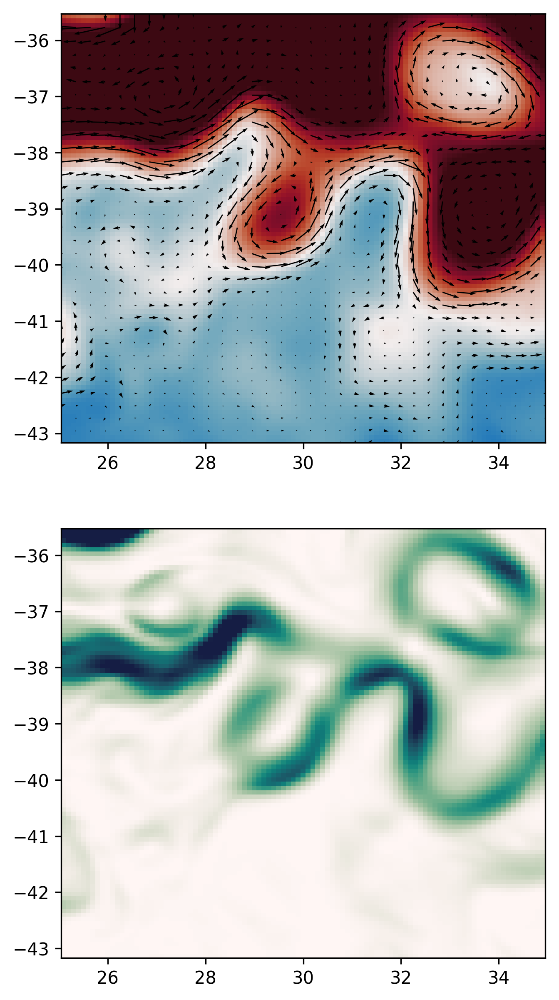

In [52]:
f, (ax1, ax2) = plt.subplots(2, 1, sharey=True,figsize=(5,10),dpi=300)
ax1.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,vmin=-.60,vmax=.60,cmap=cm.cm.balance)
#ax.colorbar()
ax1.quiver(lon[areamap[0,0]:areamap[0,1]:3],\
       lat[areamap[1,0]:areamap[1,1]:3],\
       u_eta[::3,::3],v_eta[::3,::3])
ax2.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           KEn,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
#ax1.colorbar()

In [53]:
u_eta,v_eta=geovelfield(eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
                        ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,\
                        lon[areamap[0,0]:areamap[0,1]],\
                        lat[areamap[1,0]:areamap[1,1]],\
                        mask[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]])


EKE=KE(u_eta,v_eta)

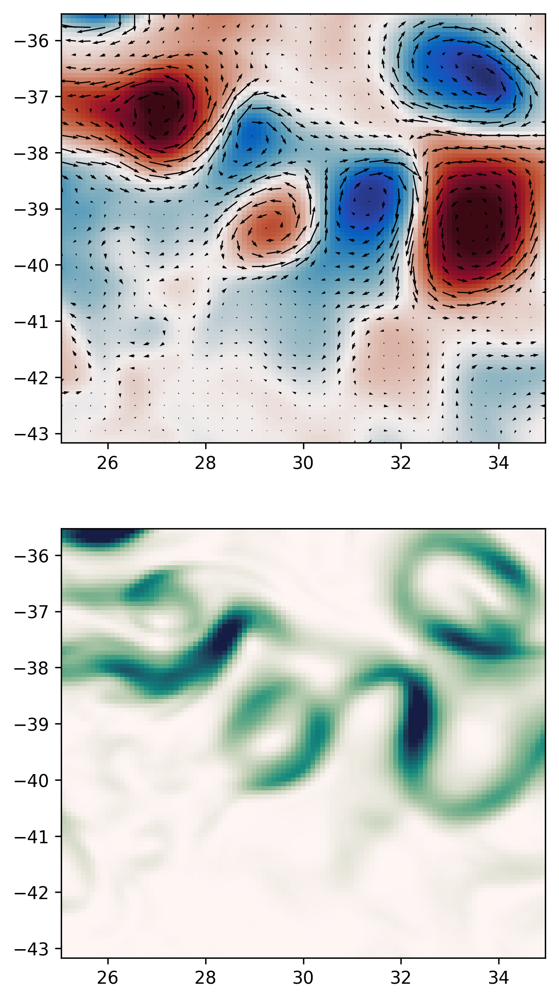

In [54]:
f, (ax1, ax2) = plt.subplots(2, 1, sharey=True,figsize=(5,10),dpi=300)
ax1.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
           ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,\
           vmin=-.60,vmax=.60,cmap=cm.cm.balance)
#ax.colorbar()
ax1.quiver(lon[areamap[0,0]:areamap[0,1]:3],\
       lat[areamap[1,0]:areamap[1,1]:3],\
       u_eta[::3,::3],v_eta[::3,::3])
ax2.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           EKE,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
#ax1.colorbar()

In [55]:
u_eddy,v_eddy=geovelfield(fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100+\
                       fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,\
                        lon[areamap[0,0]:areamap[0,1]],\
                        lat[areamap[1,0]:areamap[1,1]],\
                        mask[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]])

In [56]:
KE_eddy=KE(u_eddy,v_eddy)
print(KE_eddy.mean())

0.03287937878357028


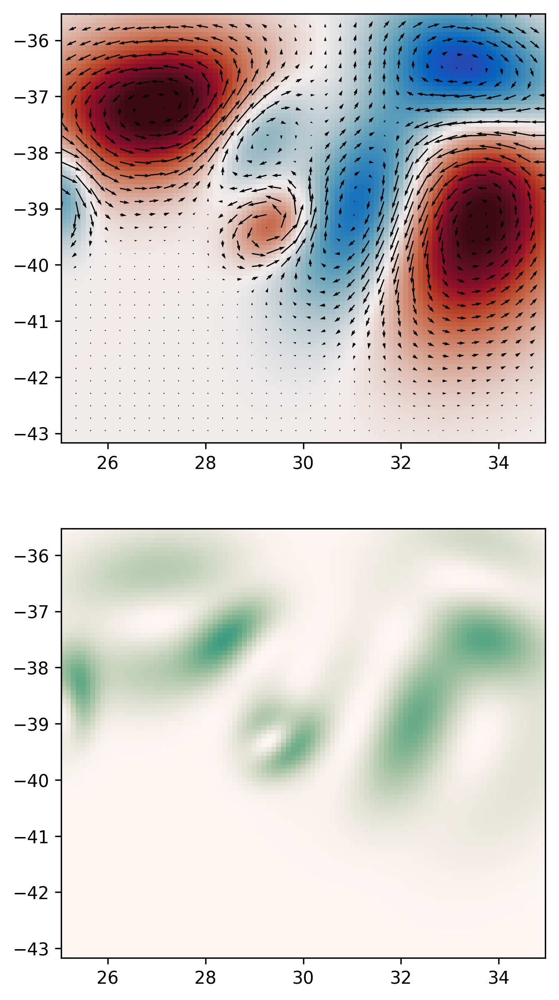

In [57]:
f, (ax1, ax2) = plt.subplots(2, 1, sharey=True,figsize=(5,10),dpi=300)
cbar1=ax1.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100+\
           fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,vmin=-.60,vmax=.60,cmap=cm.cm.balance)
#ax.colorbar()
ax1.quiver(lon[areamap[0,0]:areamap[0,1]:3],\
       lat[areamap[1,0]:areamap[1,1]:3],\
       u_eddy[::3,::3],v_eddy[::3,::3])
cbar2=ax2.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           KE_eddy,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
#fig.colorbar(cbar2,ax=ax2)

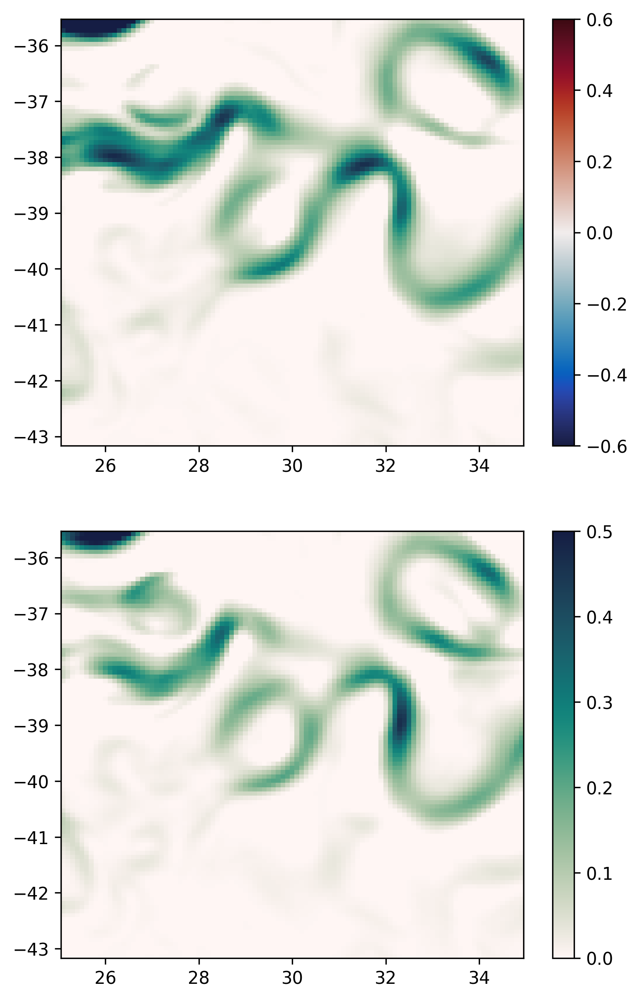

In [58]:
f, (ax1, ax2) = plt.subplots(2, 1, sharey=True,figsize=(6,10),dpi=300)
ax1.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           KEn-KE_eddy,\
           vmin=0,vmax=.5,cmap=cm.cm.tempo)
fig.colorbar(cbar1,ax=ax1)
cbar2=ax2.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           EKE-KE_eddy,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
fig.colorbar(cbar2,ax=ax2)

In [59]:
print(r'KE_e',KE_eddy.mean())
print('KE',KEn.mean())
print('EKE',EKE.mean())
print(r'KE-KE_e',(KEn-KE_eddy).mean())
print(r"EKE-KE_e",(EKE-KE_eddy).mean())

KE_e 0.03287937878357028
KE 0.07519343237663927
EKE 0.0656891071677881
KE-KE_e 0.042314053593068994
EKE-KE_e 0.03280972838421781


In [60]:
u_hat,v_hat=geovelfield(eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
                        (fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
                        +fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]])/100,\
                        lon[areamap[0,0]:areamap[0,1]],\
                        lat[areamap[1,0]:areamap[1,1]],\
                        mask[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]])

In [61]:
KE_hat=KE(u_hat,v_hat)
print(KE_hat.mean())

0.038326943144359825


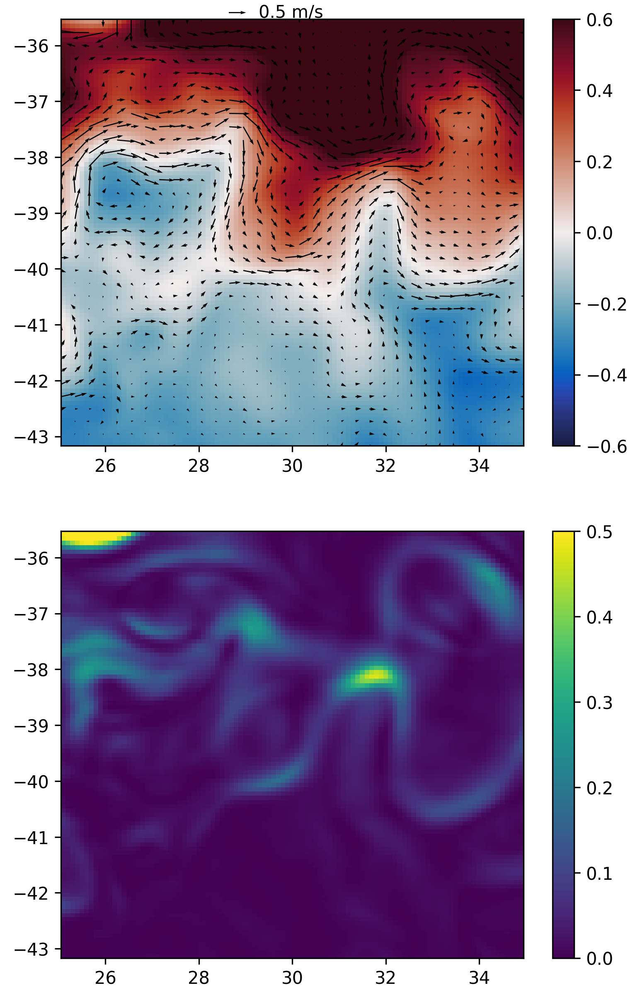

In [62]:
f, (ax1, ax2) = plt.subplots(2, 1, sharey=True,figsize=(6,10),dpi=300)
cbar1=ax1.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
           (fieldSp[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]\
           +fieldSn[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]])/100,vmin=-.6,vmax=.6,cmap=cm.cm.balance)
fig.colorbar(cbar1,ax=ax1)
Q=ax1.quiver(lon[areamap[0,0]:areamap[0,1]:3],\
       lat[areamap[1,0]:areamap[1,1]:3],\
       u_hat[::3,::3],v_hat[::3,::3])
ax1.quiverkey(Q, X=0.40, Y=1.015, U=0.5,
             label='0.5 m/s', labelpos='E')
cbar2=ax2.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
           lat[areamap[1,0]:areamap[1,1]],\
           KE_hat,vmin=0,vmax=0.5)
fig.colorbar(cbar2,ax=ax2)
#ax1.colorbar()

In [63]:
#eddytd3test=analyseddyzt(eta,lon,lat,0,30,1,40,20,1,data_meant=ssh_mean,areamap=areamap,mask=''\
#                     ,destdir='',physics='',diagnostics=False,pprint=False)

In [64]:
#eddytd3testn=analyseddyzt(eta,lon,lat,0,30,1,-40,-20,-1,data_meant=ssh_mean,areamap=areamap,mask=''\
#                     ,destdir='',physics='',diagnostics=False,pprint=False)

In [65]:
#eddytd3test['eddyn_2'].keys()

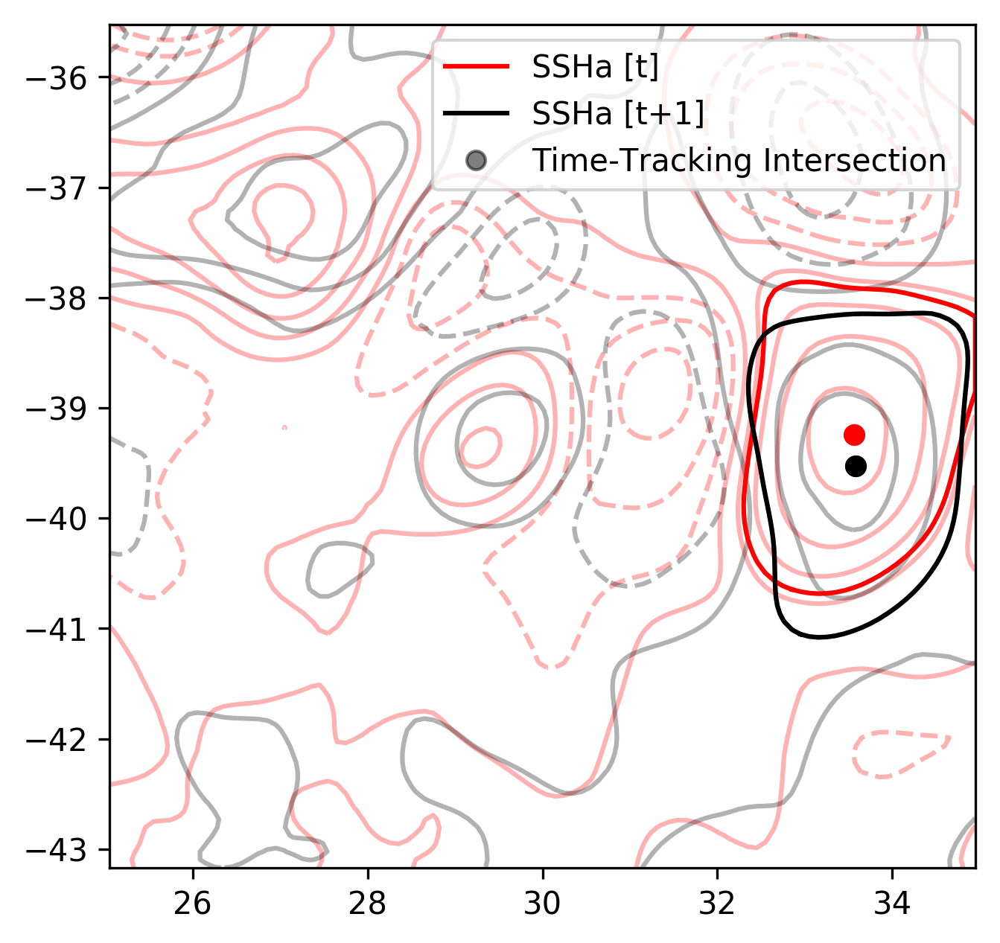

In [66]:
figure(figsize=(5,5),dpi=300)
contour(lon[areamap[0,0]:areamap[0,1]],\
        lat[areamap[1,0]:areamap[1,1]],\
        eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
        ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,\
        colors='red',alpha=0.3)
contour(lon[areamap[0,0]:areamap[0,1]],\
        lat[areamap[1,0]:areamap[1,1]],\
        eta[7,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
        ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,\
        colors='black',alpha=0.3)
eddy='eddyn_0'
plot(eddytd3[eddy]['contour'][0][0],eddytd3[eddy]['contour'][0][1],'-r',label='SSHa [t]')
plot(eddytd3[eddy]['position'][0][0],eddytd3[eddy]['position'][0][1],'or')
plot(eddytd3[eddy]['contour'][7][0],eddytd3[eddy]['contour'][7][1],'-k',label='SSHa [t+1]')
plot(eddytd3[eddy]['position'][7][0],eddytd3[eddy]['position'][7][1],'ok',alpha=0.5,label='Time-Tracking Intersection')
plot(eddytd3[eddy]['position'][7][0],eddytd3[eddy]['position'][7][1],'ok')

legend()

In [67]:
#field_anim_P=reconstruct_syntetic(shape(eta),lon,lat,eddytd3test)
#field_anim_N=reconstruct_syntetic(shape(eta),lon,lat,eddytd3testn)

field=fieldSp[:,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]+\
      fieldSn[:,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]] 
    
0,7,15,23,31,39,47,55

(0, 7, 15, 23, 31, 39, 47, 55)

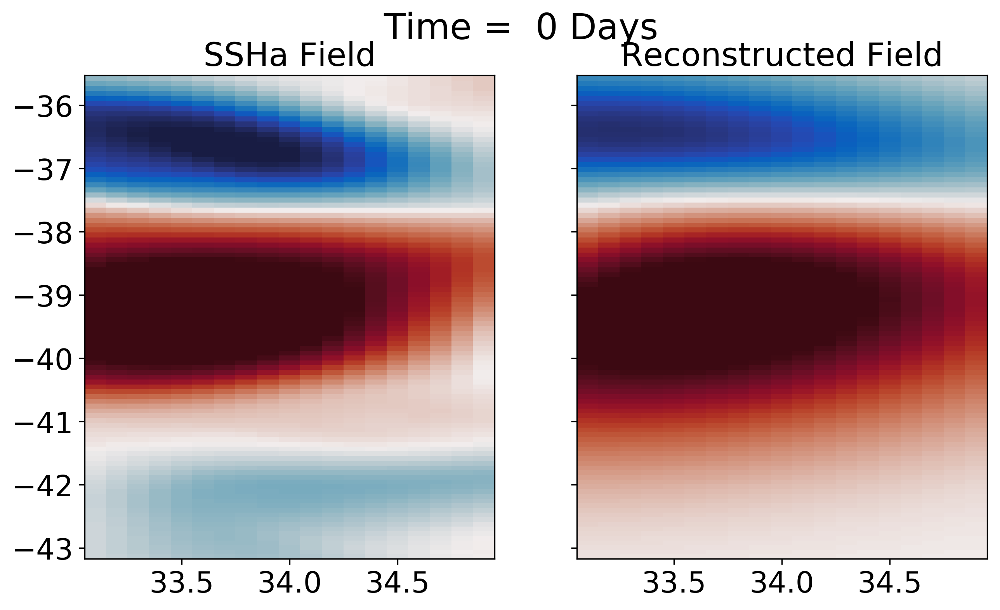

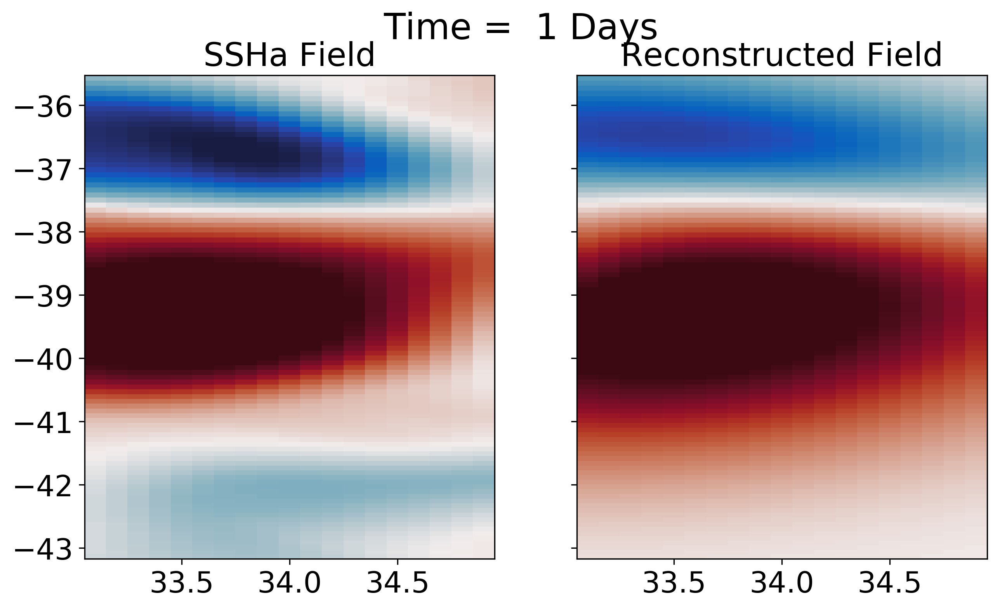

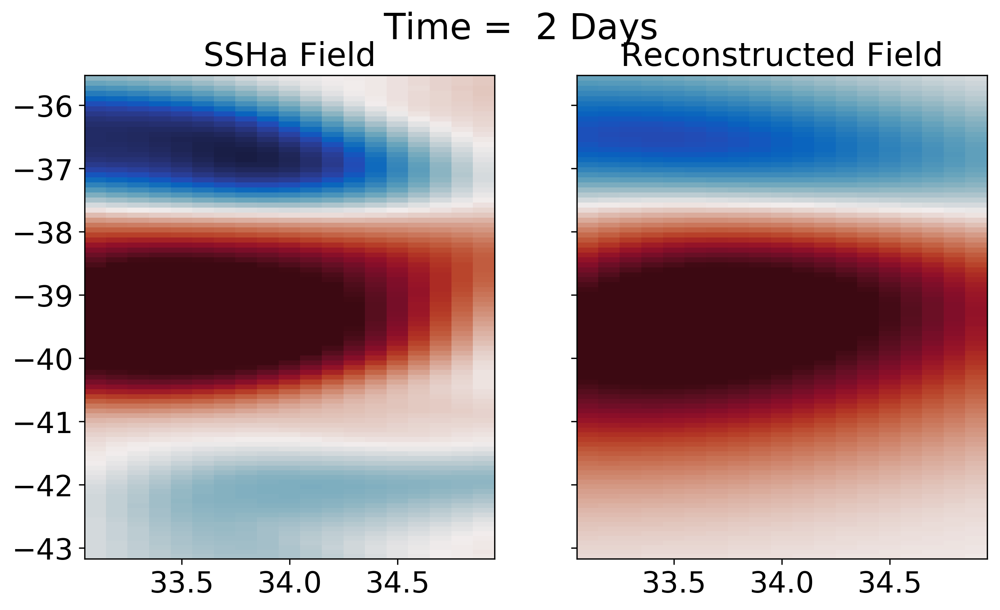

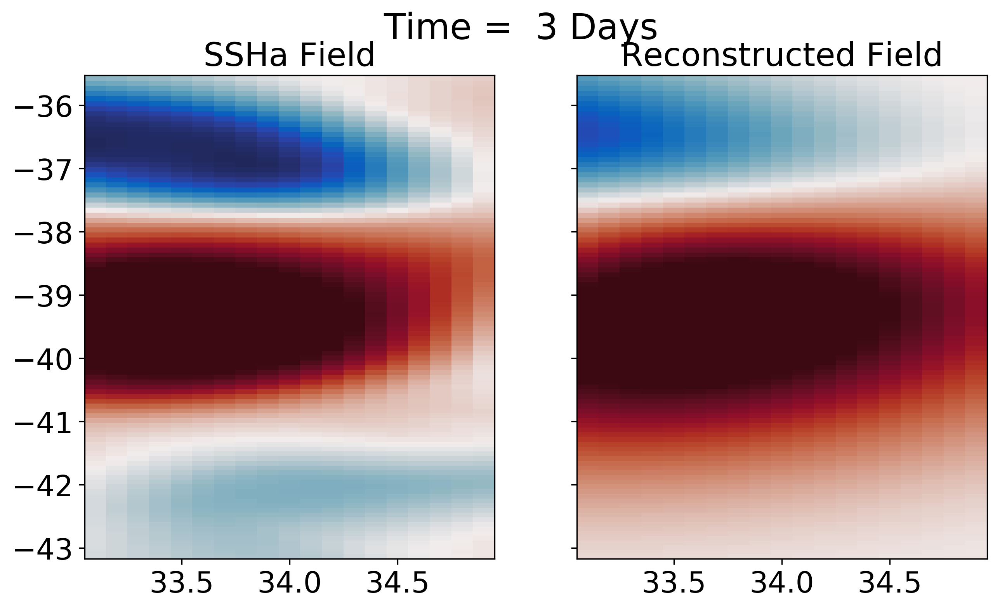

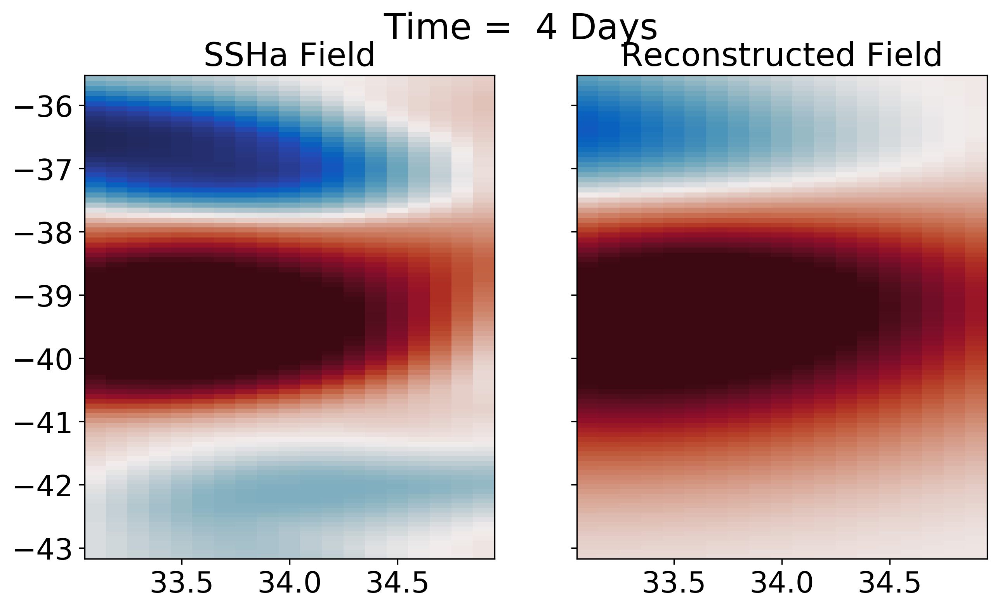

...

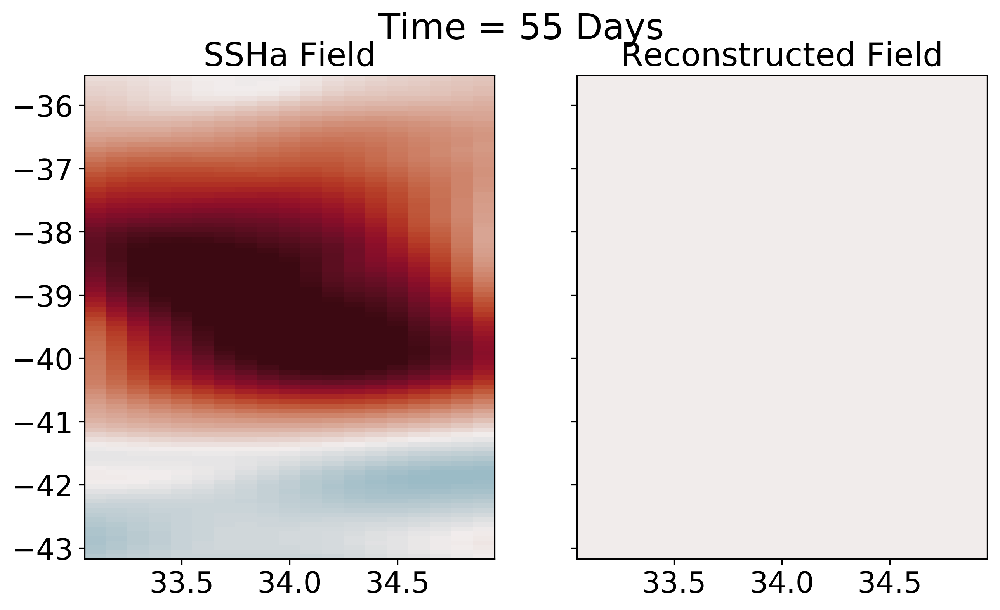

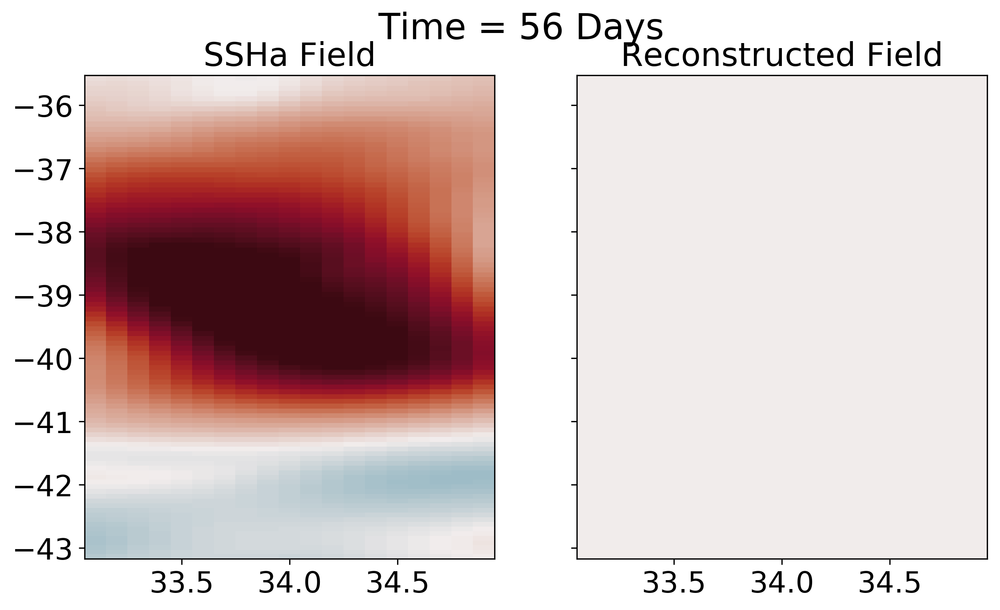

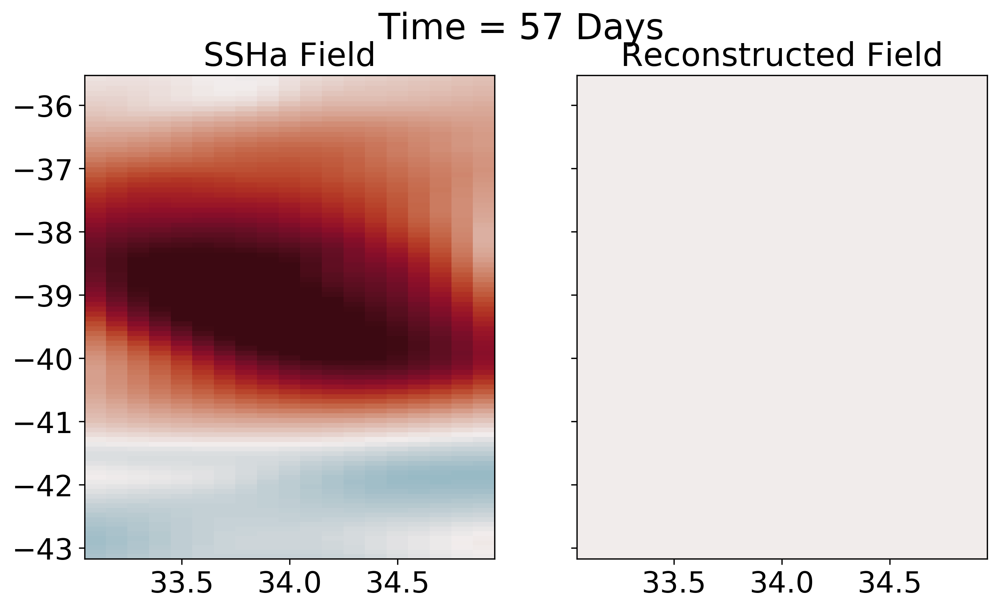

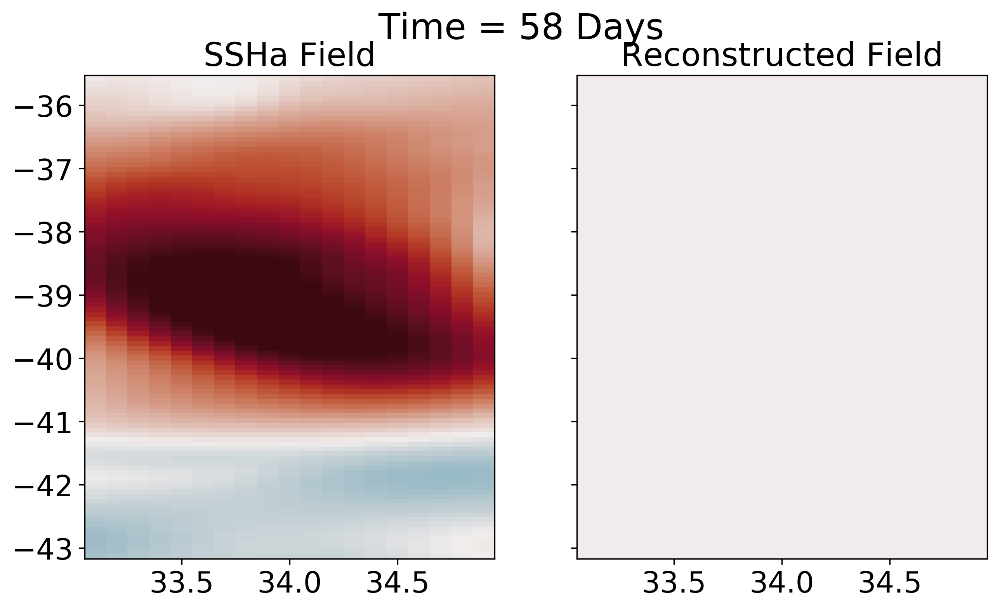

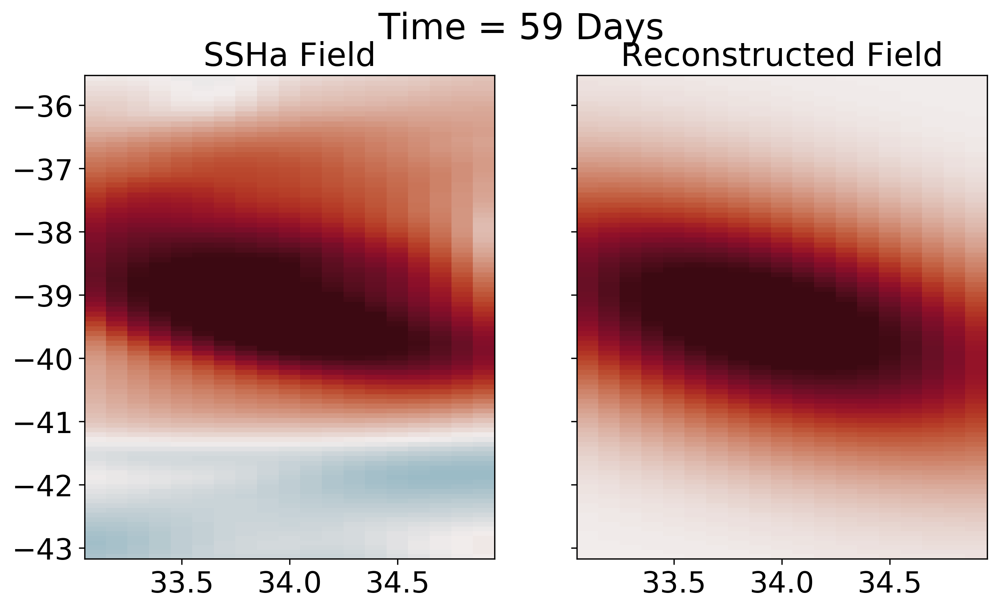

In [68]:
for ii in range(0,60):
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(10,5.5),dpi=300)
    ax1.pcolormesh(lon[areamap[0,0]+80:areamap[0,1]],\
               lat[areamap[1,0]:areamap[1,1]],\
               eta[ii,areamap[1,0]:areamap[1,1],areamap[0,0]+80:areamap[0,1]]/100-\
               ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]+80:areamap[0,1]]/100,cmap=cm.cm.balance,vmin=-0.50,vmax=0.50)
    ax1.set_title('SSHa Field',fontsize=20)
    ax1.tick_params(axis='both', labelsize=18)
    ax2.pcolormesh(lon[areamap[0,0]+80:areamap[0,1]],\
               lat[areamap[1,0]:areamap[1,1]],\
               field[ii,:,80::]/100,cmap=cm.cm.balance,vmin=-0.50,vmax=0.50)
    ax2.set_title('Reconstructed Field',fontsize=20)
    ax2.tick_params(axis='both', labelsize=18)
    plt.suptitle('Time = %2d Days' % ii,fontsize=22)
    show()

In [69]:
vargeonc('/home/156/jm5970/github/trackeddy/output/syntetic_field.nc',lat[areamap[1,0]:areamap[1,1]],lon[areamap[0,0]:areamap[0,1]],\
         field[0:15,:,:]/100,15,'syntetic_field',nc_description='Syntetic Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')

15


In [70]:
vargeonc('/home/156/jm5970/github/trackeddy/output/syntetic_field_p.nc',lat[areamap[1,0]:areamap[1,1]],lon[areamap[0,0]:areamap[0,1]],\
         fieldSp[0:15,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,15,'syntetic_pos',nc_description='Syntetic Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')
vargeonc('/home/156/jm5970/github/trackeddy/output/syntetic_field_n.nc',lat[areamap[1,0]:areamap[1,1]],lon[areamap[0,0]:areamap[0,1]],\
         fieldSn[0:15,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,15,'syntetic_neg',nc_description='Syntetic Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')

15
15


In [71]:
vargeonc('/home/156/jm5970/github/trackeddy/output/ssha_field.nc',lat[areamap[1,0]:areamap[1,1]],lon[areamap[0,0]:areamap[0,1]],\
         eta[0:15,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
         ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100,\
         15,'ssha',nc_description='SSHa Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')


15


In [72]:
vargeonc('/home/156/jm5970/github/trackeddy/output/difference.nc',lat[areamap[1,0]:areamap[1,1]],lon[areamap[0,0]:areamap[0,1]],\
         eta[0:15,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
         ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-field[0:15,:,:]/100,\
         15,'diff',nc_description='SSHa - Syntetic Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')



15


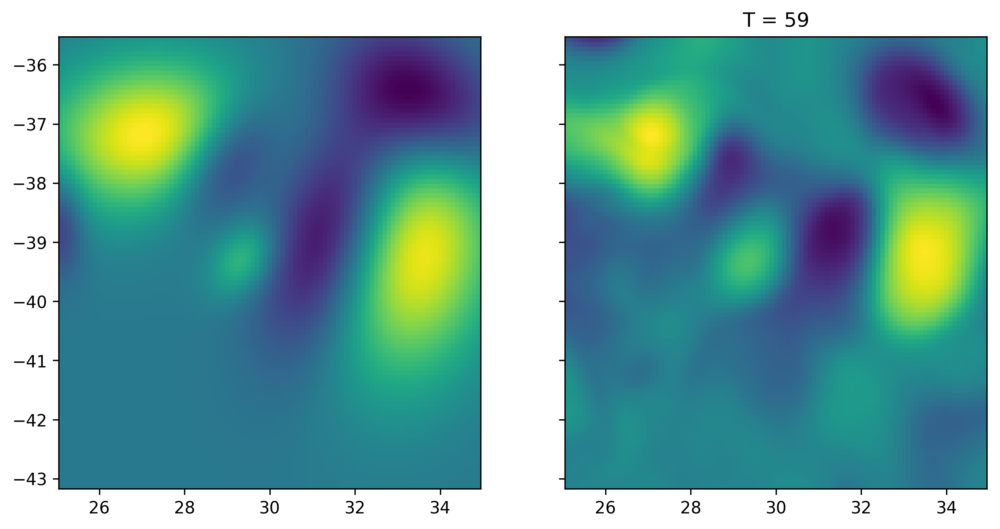

In [73]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(10,5),dpi=300)
ax1.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
               lat[areamap[1,0]:areamap[1,1]],\
               field[0,:,:])
ax2.pcolormesh(lon[areamap[0,0]:areamap[0,1]],\
               lat[areamap[1,0]:areamap[1,1]],\
               eta[0,areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100-\
               ssh_mean[areamap[1,0]:areamap[1,1],areamap[0,0]:areamap[0,1]]/100)
title('T = %d' %ii )
show()

In [74]:
pos=[0.907033126853,0.905227377193,0.905227377175,0.896713495381,0.895396119365,0.895396119355,0.887947727673,0.879303841427,\
    0.877538989216,0.877538989143,0.996401314707,0.875376438784,0.865807326165,0.99426403602,0.865807326108,0.992023244025,\
    0.859905310447,0.989980644565,0.98675760525,0.984807638574,0.981637480104,0.980019241931,0.980019241932,0.978894597114,\
    0.977386804328,0.972922025433,0.972922025437,0.82536581074,0.970862780922,0.965263172995,0.931643746824,0.965263172993,\
    0.885367415283,\
    0.941499929064,0.938317301291,0.95985520007,0.919666316164,0.955782427138,0.915078886188,0.937961977254,0.930120293033,\
    0.934582575989,0.923709221989,0.934582576063,0.92370922199,0.916025591068,0.899207613561,0.915028977272,0.899207613603,\
    0.908203455515,0.95346591152,0.894998924178,0.897736249125,0.952249663496,0.906437296344,0.896585258974,0.952249663511,\
    0.902427461656,0.88817539644,0.95224966351,0.877104963321,0.889625874702,0.945381573588,0.849793864555,0.889625874384,\
    0.945822894719,0.821544709487,0.881775384363,0.817628508883,0.88123311218,0.793220310797,0.88123311184,0.760273730862,\
    0.86537364232,0.75376806036,0.872222879121,0.728150996819,0.85587165359,0.724655822299,0.84641592454,0.699307761874,\
    0.845879696228,0.671558411347,0.835792715455]
print(mean(pos),len(pos))

0.9000999727035951 84


In [75]:
eddytdp=analyseddyzt(eta,lon,lat,0,1,1,40,5,5,data_meant=ssh_mean,areamap=array([[0,len(lon)],[0,len(lat)]]),\
                     mask='',\
                     destdir='',physics='',diagnostics=False,pprint=False)

1.028505639869436
0.9616469035000034
1.0113841203792595
0.9799238504170933
1.037564999899385
0.917534512545965
0.9516218977847323
1.0195654122731999
0.9675801389319585
0.9631309076644128
0.9798550254759575
0.9965945307653196
0.9570724022717807
0.9867654757633817
0.9128058839418179
0.930879344673832
1.0621301440411839
0.9282163589291391
1.0155164898668907
1.7082003406987305
1.0408803466573469
1.0691159016146596
1.0076697040134377
0.9525790499025301
0.9566554963826175
0.9843734792106531
0.9280718744432199
0.9776404056133395
0.9700055991786827
0.9227355671349734
1.008622318795728
0.9787180616608938
0.9219990156752608
0.9608605182365139
0.9973888344338868
0.9202587946687346
0.9833110859742058
0.9261430457808685
0.9196144347523837
0.9972063261496064
0.9535631614087743
1.819034010388263
1.090122500845039
0.997293603898006
1.0210969300795874
1.058406882245699
0.9574705744913558
1.0521708793623163
0.9508522594683747
1.0084015832072144
0.9439169859428466
0.9633717422159929
0.9544019345302421
0.

1.591949467429385
1.3228865293497594
-1.4988130574055332
1.0490416101365994
1.0308134080561224
1.4325875654460551
1.3768303296915376
1.1683683038408301
1.0308613283474233
1.756294867848833
-1.5367438836546257
1.0588935666852963
1.8243005624577628
2.965379958335207
1.0022051145862858
3.9662852810000784
-0.8427351906279292
1.1990675026630315
1.2178604580279961
0.9857219310584119
0.9886086533771007
1.1602847878654483
-4.995455388949074
3.0806051368662963
2.3748878279159147
1.2280823549545168
1.0347805306897035
0.9737009868666329
1.2020984893667843
1.0462505588112918
1.0196681146539956
1.616318151486083
1.2092583154264072
0.9969034572316113
1.0326930262310472
1.0565522758512464
1.0124149012339052
1.0338382140871492
1.057813802870101
5.62814614682966
1.3782573567771113
2.6637789878263702
0.027915875580513103
1.1463232319222332
0.9857870393926115
1.6706940549444826
1.0851689886116047
1.3158633065726861
1.0529921767860178
1.073884591853683
1.3321257305082805
13.814142512330681
2.1234953794128

In [76]:
eddytdn=analyseddyzt(eta,lon,lat,0,1,1,-40,-5,-5,data_meant=ssh_mean,areamap=array([[0,len(lon)],[0,len(lat)]]),\
                     mask='',\
                     destdir='',physics='',diagnostics=False,pprint=False)

0.9657973801619477
0.9901668908963771
0.9465346997786561
1.0078785675799753
0.9527561483477697
0.9912515754260178
0.987240079997593
0.9732203647361249
1.0241438360147983
0.9483380183369884
0.9801960236250998
0.9904464432393237
0.9699894760557796
1.0079689503124118
0.9164157561689982
0.9981372768765867
1.050553111725007
1.1075778145060207
-7.7525744396205605
0.9821774296644877
1.0473722571114399
1.0272113628155028
1.0227285101862875
1.007788705765482
0.9853786043043352
0.9646154299156824
1.0123614365378069
1.075363283347882
0.9424200734777399
1.056004441517343
0.9492117808070275
1.012998890936095
0.9897930795548883
0.9927822910355596
1.040911660207696
1.0121218474408835
0.9195170113038544
0.9126688140206201
1.06391719738515
1.1897455875190497
0.9596162066605399
0.9333371720215865
1.161244644778076
-1.3625012638517564
0.9832754343772943
1.038102266274128
1.0998210119395317
1.0174287498628634
1.0165369261584318
0.9824554701674517
0.9516018293401478
1.0349843028074035
0.9576370682099392
1.

-3.55254003919699
1.2426314312708844
1.707914246085973
-0.9326897486207089
-2.958542085948098
1.0291534382428296
1.6836057831328155
0.9821864076995593
6.185522722780458
1.4413075783479703
4.225896466134344
1.2614966466687072
1.6210030587112711
1.040377733767882
1.4947611675841852
1.0063398654398052
1.0710905072399013
1.0359853951744447
1.034718624995513
1.080251557557435
1.4047087417162092
1.5958332658155483
1.2556414976065986
2.1672165363438456
1.0409112050232456
1.4637679257506986
2.440100714446734
4.250218513797142
1.0830015363563767
1.11943326482068
1.0253014246890269
2.3872710092886837
1.1345013818807999
0.9056860504386788
0.9582393365193671
1.6162231919791537
1.390152597178125
1.376629200082865
1.1221263607811311
1.8163072316141828
-15.001070839697803
3.0665904342843247
1.4159108705129
1.5013537258054155
0.9415395142151269
1.5374197957308786
1.106207273902261
0.9381416000784875
1.0307542664284843
-0.21471371280134519
1.0152031612477852
2.2271288911983693
1.2432503765719705
1.0999

In [77]:
southernn=reconstruct_syntetic(shape(eta),lon,lat,eddytdn)
southernp=reconstruct_syntetic(shape(eta),lon,lat,eddytdp)
southern=southernn+southernp

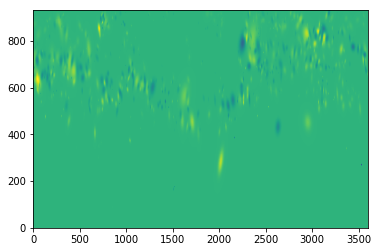

In [78]:
pcolormesh(southern[0,:,:])

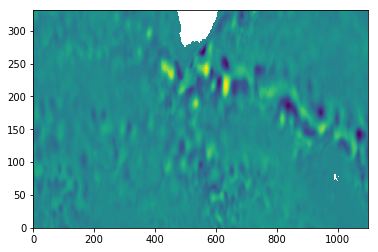

In [79]:
pcolormesh(eta[0,600:,2500:]-ssh_mean[600:,2500:])

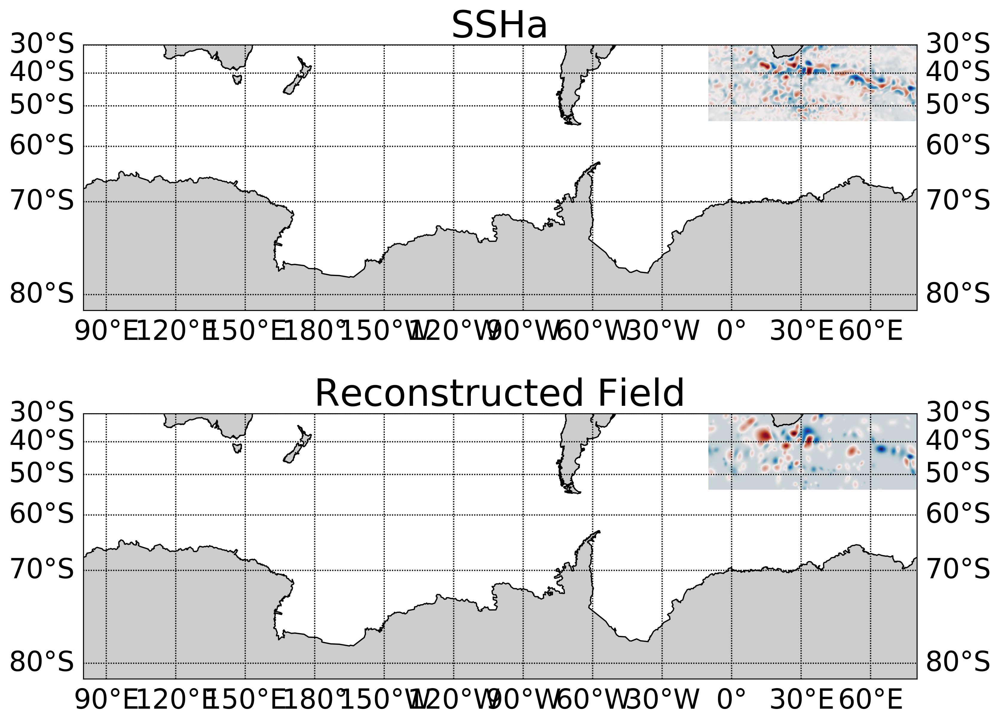

In [80]:

from mpl_toolkits.basemap import Basemap

fig, ax = plt.subplots(2, 1, figsize=(12,10),dpi=300)


latcorners = lat[:]
loncorners = lon[:]
lon_0=lon[2700]
lat_0=lat[600]

llon,latt=meshgrid(lon[2700:],lat[600:])

m = Basemap(projection='merc',lon_0=lon_0,lat_0=90.,lat_ts=lat_0,\
            rsphere=(6378137.00,6356752.3142),\
            llcrnrlat=latcorners[0],urcrnrlat=latcorners[-1],\
            llcrnrlon=loncorners[0],urcrnrlon=loncorners[-1],\
            resolution='l',area_thresh=10000,ax=ax[0])

m.drawcoastlines()
m.fillcontinents()
m.drawparallels(np.arange(-10,-90,-10),labels=[1,1,0,1],fontsize=22)
# draw meridians
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1],fontsize=22)
Lon,Lat=m(llon,latt)
ax[0].pcolormesh(Lon,Lat,eta[0,600:,2700:]-ssh_mean[600:,2700:],cmap=cm.cm.balance)
tt=ax[0].set_title('SSHa', fontsize=30)
tt.set_position([.5, 1.001])
m = Basemap(projection='merc',lon_0=lon_0,lat_0=90.,lat_ts=lat_0,\
            rsphere=(6378137.00,6356752.3142),\
            llcrnrlat=latcorners[0],urcrnrlat=latcorners[-1],\
            llcrnrlon=loncorners[0],urcrnrlon=loncorners[-1],\
            resolution='l',area_thresh=10000,ax=ax[1])

m.drawcoastlines()
m.fillcontinents()
m.drawparallels(np.arange(-10,-90,-10),labels=[1,1,0,1],fontsize=22)
# draw meridians
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1],fontsize=22)
Lon,Lat=m(llon,latt)
ax[1].pcolormesh(Lon,Lat,southern[0,600:,2700:],cmap=cm.cm.balance)
ttl=ax[1].set_title('Reconstructed Field', fontsize=30)
ttl.set_position([.5, 1.001])
 
#basemap_mplot(lon[2700:],lat[600:],[eta[0,600:,2700:]-ssh_mean[600:,2700:],southern[0,600:,2700:]],\
#              ['SSHa','Reconstructed_field'],projection='merc',lat_0=-90,lon_0=-100,boundinglat=-30,\
#              resolution='c',scale='Lin',vmin=-50,vmax=50,cmap=cm.cm.balance,xan=1,yan=2,figsize=(10,10),fontsize=15)

In [81]:
def geovelfield(ssha,lon,lat,mask,value):
    ma.filled(ssha,np.nan)
    distmlon=sw.dist(0,lon,'km')[0][:]*1000
    distmlat=sw.dist(0,lat,'km')[0][:]*1000
    mlon=np.cumsum(distmlon)
    mlat=np.cumsum(distmlat)
    dy=np.gradient(mlat)
    dx=np.gradient(mlon)
    detay,detax=np.gradient(ssha)
    omega = 7.2921e-5
    g=9.81
    f=2*omega*np.sin(np.deg2rad(lat))
    u=np.zeros(np.shape(ssha))
    v=np.zeros(np.shape(ssha))
    for ii in range(np.shape(ssha)[1]-1):
        detaxdy=detax[:,ii]/dx[ii]
        v[:,ii]=(g/f)*(detaxdy)
    for jj in range(np.shape(ssha)[0]-1):
        detaydx=detay[jj,:]/dy[jj]
        u[jj,:]=-(g/f[jj])*(detaydx)
    u[u>value]=nan
    v[v>value]=nan
    u[u<-value]=nan
    v[v<-value]=nan
    u= np.ma.masked_array(u, mask)
    v= np.ma.masked_array(v, mask)
    return u,v

In [82]:
u_eta,v_eta=geovelfield(eta[0,:,:]/100,loncorners,latcorners,mask[:,:],5)
KEn=KE(u_eta,v_eta)

In [83]:
u_eta,v_eta=geovelfield(eta[0,:,:]/100-ssh_mean[:,:]/100,loncorners,latcorners,mask[:,:],5)
EKE=KE(u_eta,v_eta)

In [84]:
u_eddy,v_eddy=geovelfield(southern[0,:,:]/100,loncorners,latcorners,mask[:,:],5)
KE_eddy=KE(u_eddy,v_eddy)

[[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff264740ac8>


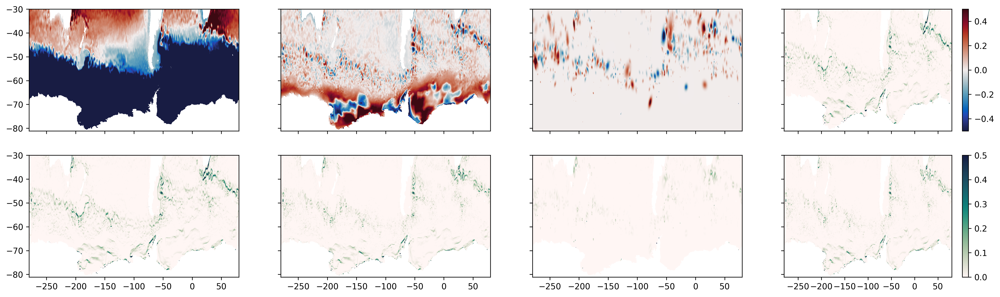

In [85]:
f, ax = plt.subplots(2, 4, sharey=True, sharex=True,figsize=(21,6),dpi=300)
print(ax)
cbar1=ax[0,0].pcolormesh(loncorners,latcorners,\
           eta[0,:,:]/100,\
           vmin=-0.5,vmax=.5,cmap=cm.cm.balance)
ax[1,0].pcolormesh(loncorners,latcorners,\
           KEn,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
ax[0,1].pcolormesh(loncorners,latcorners,\
           eta[0,:,:]/100-ssh_mean[:,:]/100,\
           vmin=-0.5,vmax=.5,cmap=cm.cm.balance)
ax[1,1].pcolormesh(loncorners,latcorners,\
           EKE,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
ax[0,2].pcolormesh(loncorners,latcorners,\
           southern[0,:,:]/100,\
           vmin=-0.5,vmax=.5,cmap=cm.cm.balance)
cbar2=ax[1,2].pcolormesh(loncorners,latcorners,\
           KE_eddy,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
ax[0,3].pcolormesh(loncorners,latcorners,\
           KEn-KE_eddy,\
           vmin=0,vmax=.5,cmap=cm.cm.tempo)
fig.colorbar(cbar1,ax=ax[0,3])
cbar2=ax[1,3].pcolormesh(loncorners,latcorners,\
           EKE-KE_eddy,vmin=0,vmax=0.5,cmap=cm.cm.tempo)
fig.colorbar(cbar2,ax=ax[1,3])

In [86]:
print(r'KE_e',KE_eddy.mean())
print('KE',KEn.mean())
print('EKE',EKE.mean())
print(r'KE-KE_e',(KEn-KE_eddy).mean())
print(r"EKE-KE_e",(EKE-KE_eddy).mean())

KE_e 0.001781585228869213
KE 0.011801422359448734
EKE 0.00847630536404742
KE-KE_e 0.010060989073317643
EKE-KE_e 0.00673574142293846


In [87]:
vargeonc('/home/156/jm5970/github/trackeddy/output/syntetic_field.nc',loncorners,latcorners,\
         southern[0,600:,2700:]/100,1,'syntetic_field',nc_description='Syntetic Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')
vargeonc('/home/156/jm5970/github/trackeddy/output/syntetic_field_p.nc',loncorners,latcorners,\
         southernp[0,600:,2700:]/100,1,'syntetic_pos',nc_description='Syntetic Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')
vargeonc('/home/156/jm5970/github/trackeddy/output/syntetic_field_n.nc',loncorners,latcorners,\
         southernn[0,600:,2700:]/100,1,'syntetic_neg',nc_description='Syntetic Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')

vargeonc('/home/156/jm5970/github/trackeddy/output/ssha_field.nc',loncorners,latcorners,\
           eta[0,600:,2700:]/100-ssh_mean[600:,2700:]/100,\
         1,'ssha',nc_description='SSHa Field Data',units='m',dt='',dim='2D',format='NETCDF3_CLASSIC')


1


ValueError: cannot reshape array of size 297900 into shape (1,3600,931)